<h1 style='text-align:center; font-size:30px; style:bold;'>TVA Analysis</h1>
<div style='text-align:center;'>
    
</div>

In [1]:
import os.path
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker
import seaborn as sns
import joblib
import DER
from IPython.display import display
plt.style.use("ggplot")

In [2]:
simulations = []
for i in glob.glob("results/*"):
    tmp = joblib.load(i)
    tmp.title = os.path.basename(i).replace(".gz", "").replace("_", " ")
    simulations.append(tmp)

In [3]:
[s.title for s in simulations]

['r once reb 0 sun 4',
 'r once reb 26(All) sun 4',
 'r once reb 26(PV) sun 4',
 'r once reb 26(PV) sun 4 no decom',
 'r once reb 26(PV) sun 7',
 'r reg reb 0 sun 4',
 'r reg reb 26(All) sun 4',
 'r reg reb 26(PV) sun 4',
 'r reg reb 26(PV) sun 4 no decom',
 'r reg reb 26(PV) sun 7']

# Network Adoption summary

## Compare Ramsey scenarios

In [4]:
comparisions = [
    [
        'r reg reb 0 sun 4',
        'r once reb 0 sun 4',
    ], [
        'r reg reb 26(PV) sun 4',
        'r once reb 26(PV) sun 4',
    ], [
        'r reg reb 0 sun 4',
        'r reg reb 26(PV) sun 4',
    ], [
        'r once reb 26(PV) sun 7',
        'r reg reb 26(PV) sun 7',
    ], [
        'r reg reb 26(PV) sun 4',
        'r reg reb 26(PV) sun 7',
    ]
]

## Number of Active Residential Customers

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1434367536.py:11: FutureWarning: 'm' is deprecated and will be removed in a future version, please use 'ME' instead.
  ).resample('m').mean()


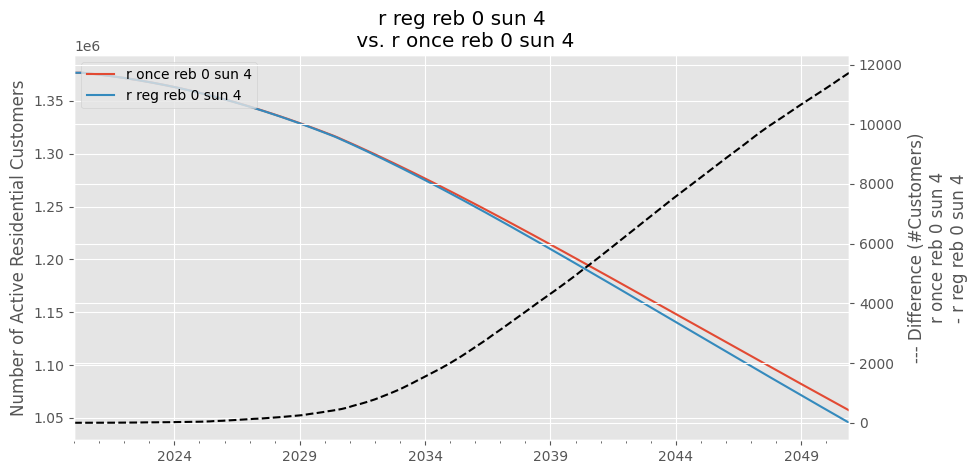

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1434367536.py:11: FutureWarning: 'm' is deprecated and will be removed in a future version, please use 'ME' instead.
  ).resample('m').mean()


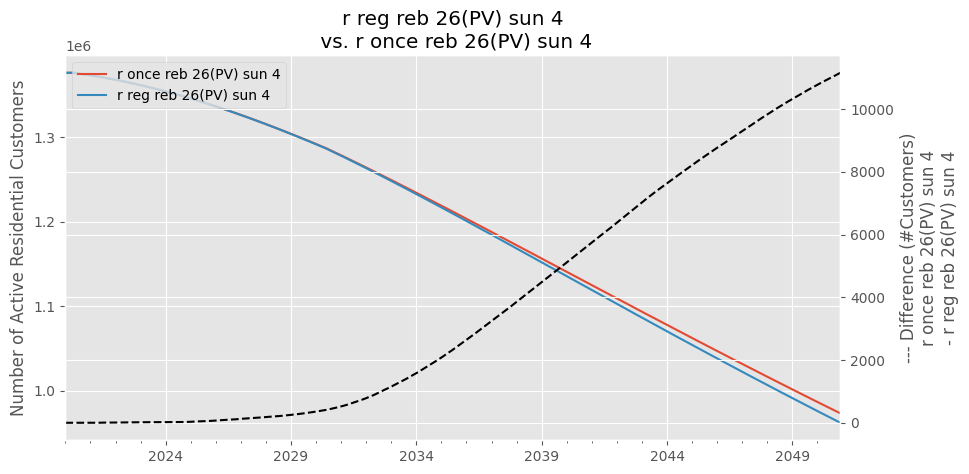

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1434367536.py:11: FutureWarning: 'm' is deprecated and will be removed in a future version, please use 'ME' instead.
  ).resample('m').mean()


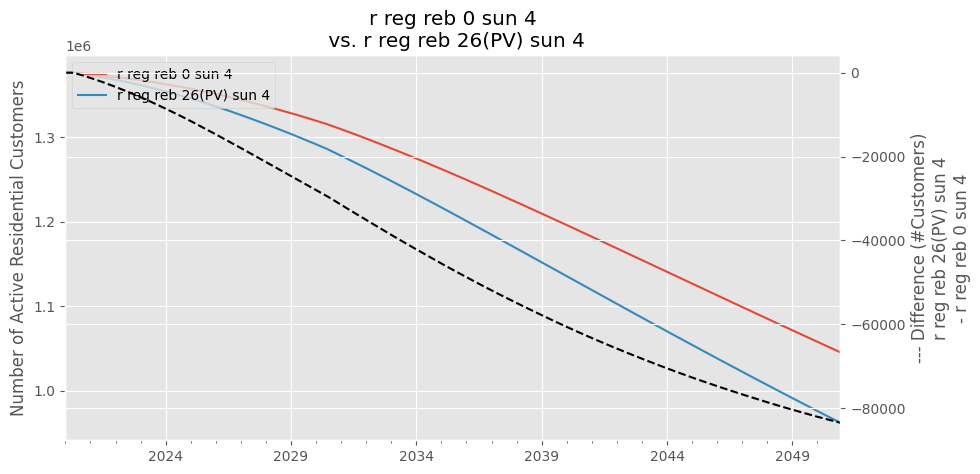

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1434367536.py:11: FutureWarning: 'm' is deprecated and will be removed in a future version, please use 'ME' instead.
  ).resample('m').mean()


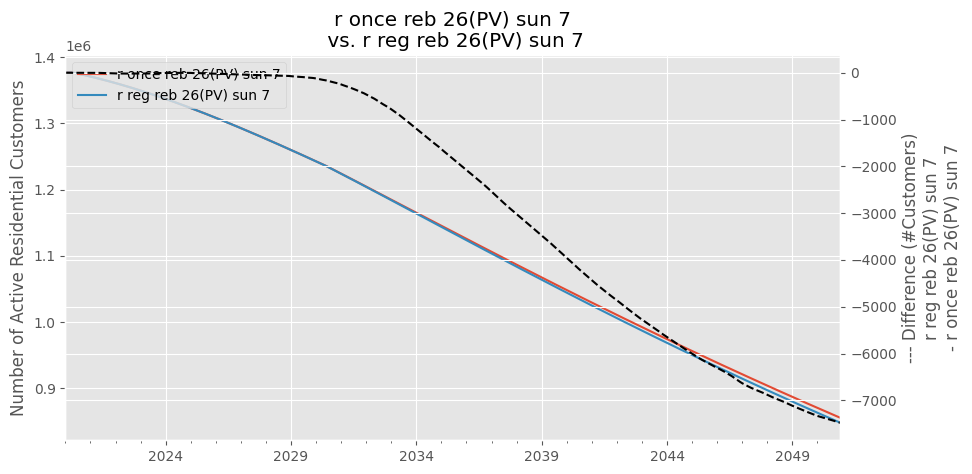

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1434367536.py:11: FutureWarning: 'm' is deprecated and will be removed in a future version, please use 'ME' instead.
  ).resample('m').mean()


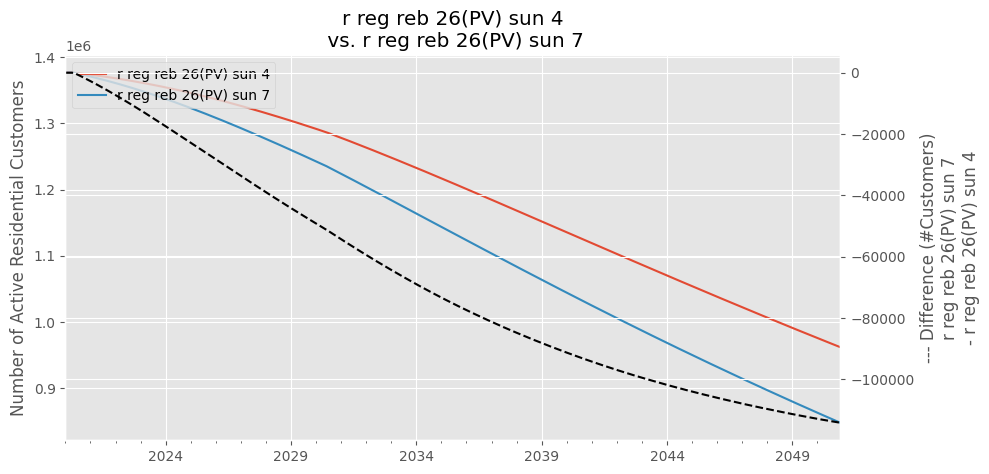

In [5]:
for comparision in comparisions:
    plt.figure(figsize=(10,5), dpi=100)
    ax = plt.gca()
    tmp = pd.DataFrame(
        {
            s.title: pd.DataFrame({l.name: l.number_of_active_customers for l in s.lses if "Residential" in l.name}, index=s.time).sum(axis=1)
            for s in simulations
            if s.title in comparision
        },
        index=simulations[0].time
        ).resample('m').mean()

    tmp.plot(ax=ax)
    ax.legend(loc=2)
    ax.set_ylabel("Number of Active Residential Customers")
    ax2 = ax.twinx()
    (tmp[comparision[1]] - tmp[comparision[0]]).plot(ax=ax2, color='k', style='--', label='Difference')
    ax2.set_ylabel(f"--- Difference (#Customers)\n{comparision[1]}\n- {comparision[0]}")
    plt.title(f"{comparision[0]}\n vs. {comparision[1]}")
    plt.show()

## High-Income vs. Low-Income

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1514255840.py:12: FutureWarning: 'm' is deprecated and will be removed in a future version, please use 'ME' instead.
  tmp = tmp.resample('m').mean()


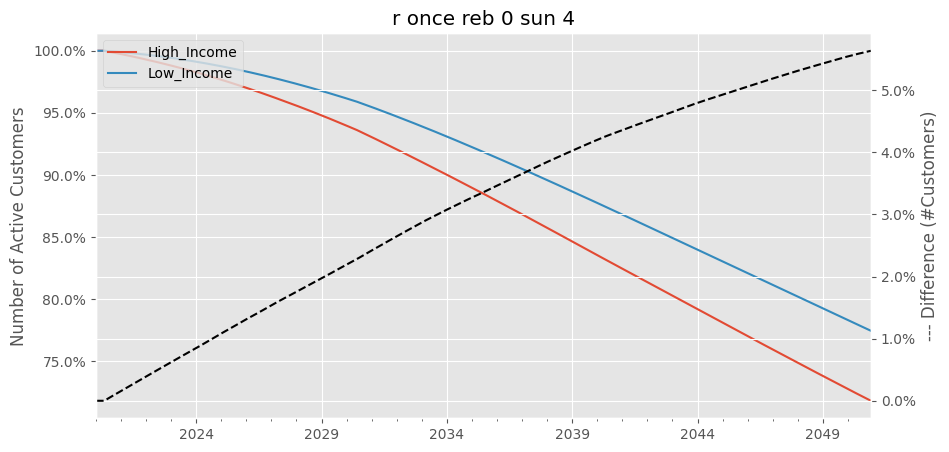

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1514255840.py:12: FutureWarning: 'm' is deprecated and will be removed in a future version, please use 'ME' instead.
  tmp = tmp.resample('m').mean()


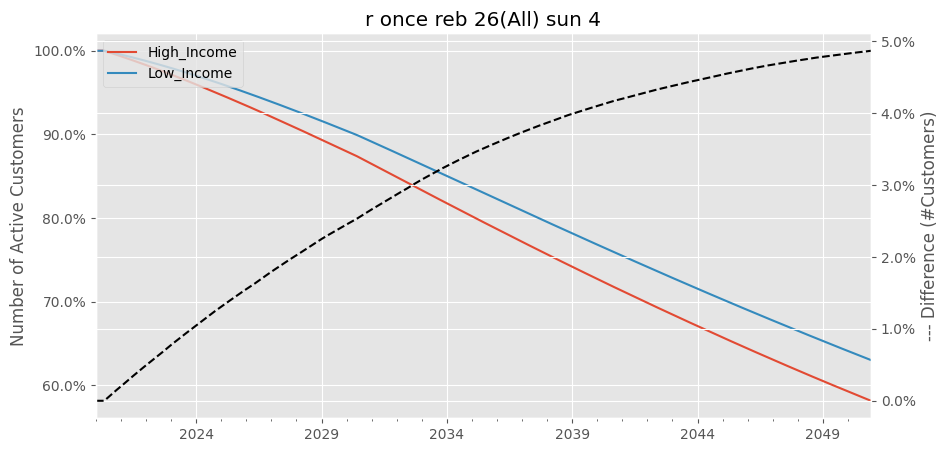

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1514255840.py:12: FutureWarning: 'm' is deprecated and will be removed in a future version, please use 'ME' instead.
  tmp = tmp.resample('m').mean()


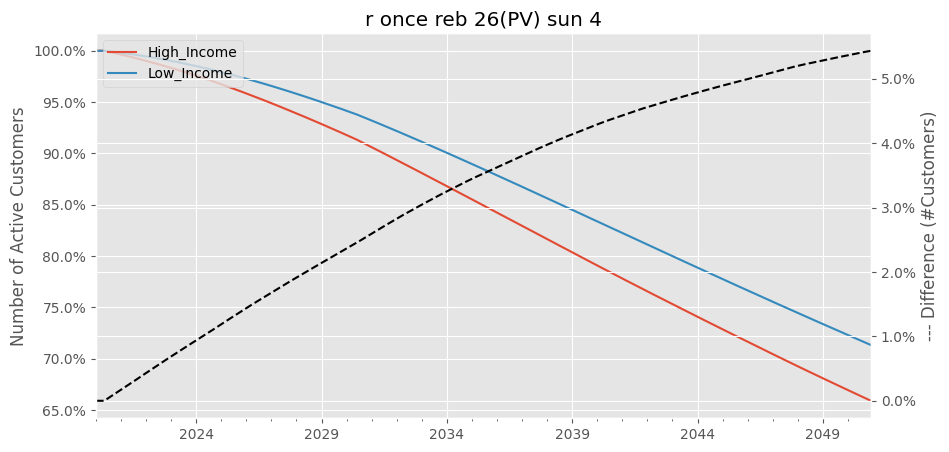

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1514255840.py:12: FutureWarning: 'm' is deprecated and will be removed in a future version, please use 'ME' instead.
  tmp = tmp.resample('m').mean()


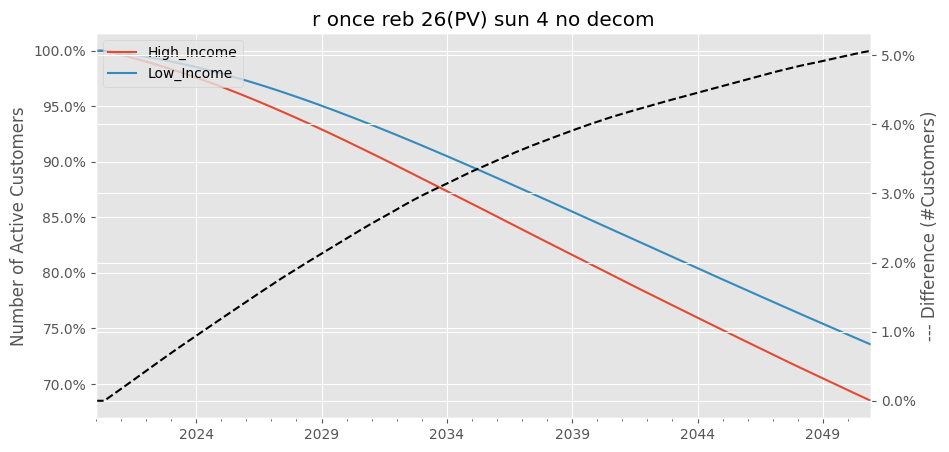

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1514255840.py:12: FutureWarning: 'm' is deprecated and will be removed in a future version, please use 'ME' instead.
  tmp = tmp.resample('m').mean()


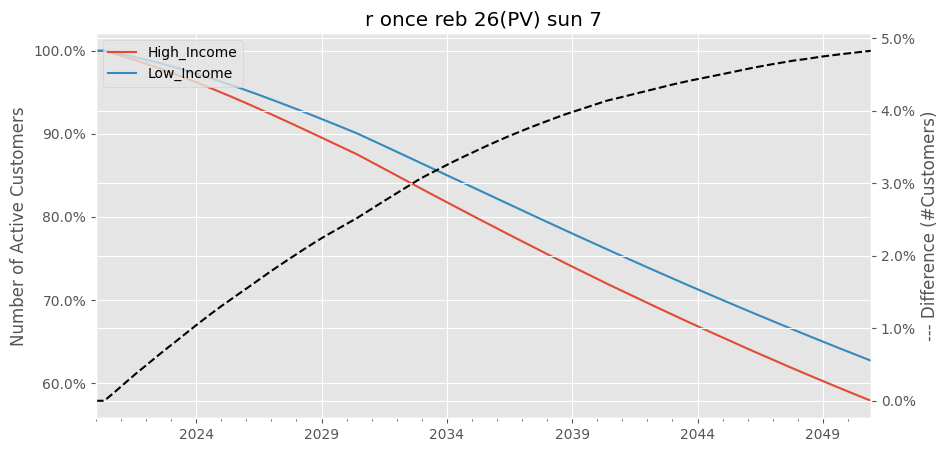

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1514255840.py:12: FutureWarning: 'm' is deprecated and will be removed in a future version, please use 'ME' instead.
  tmp = tmp.resample('m').mean()


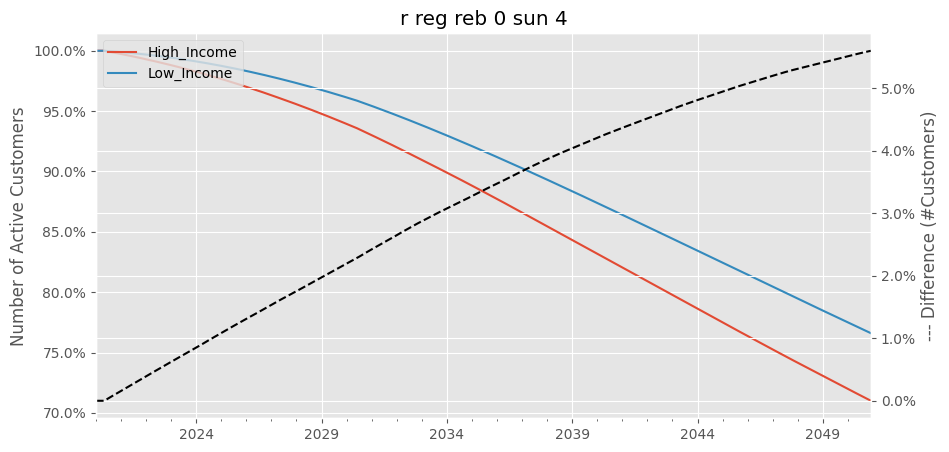

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1514255840.py:12: FutureWarning: 'm' is deprecated and will be removed in a future version, please use 'ME' instead.
  tmp = tmp.resample('m').mean()


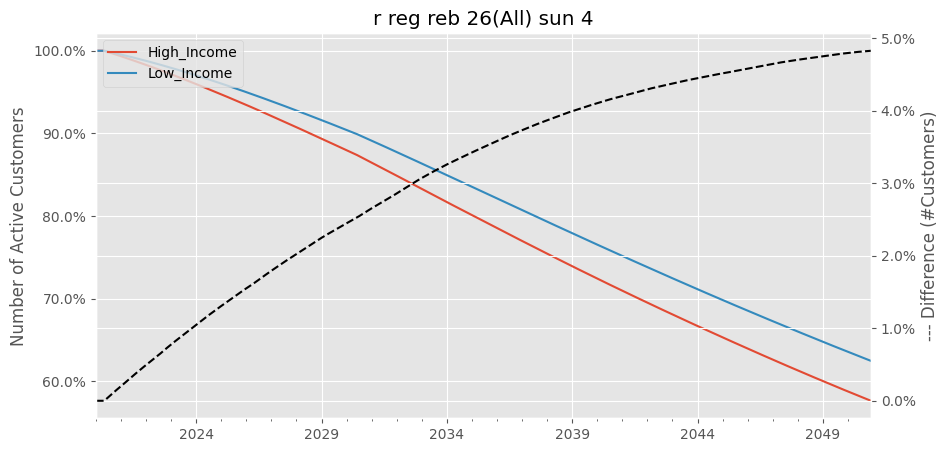

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1514255840.py:12: FutureWarning: 'm' is deprecated and will be removed in a future version, please use 'ME' instead.
  tmp = tmp.resample('m').mean()


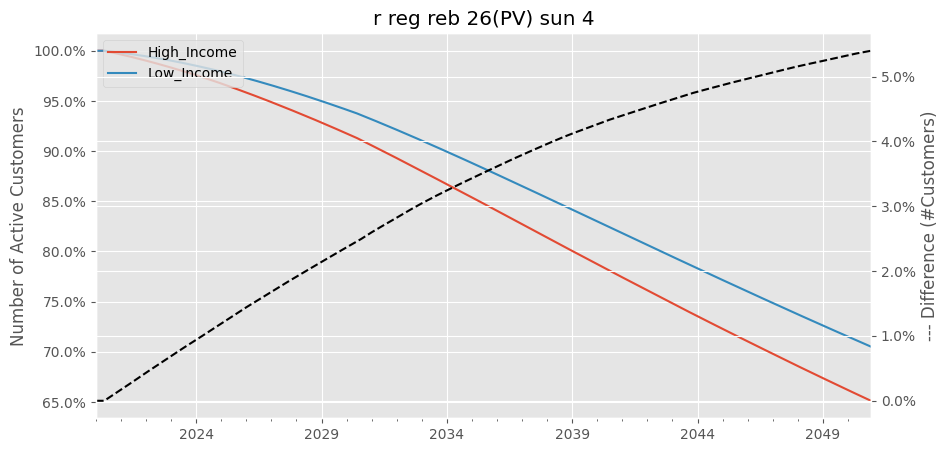

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1514255840.py:12: FutureWarning: 'm' is deprecated and will be removed in a future version, please use 'ME' instead.
  tmp = tmp.resample('m').mean()


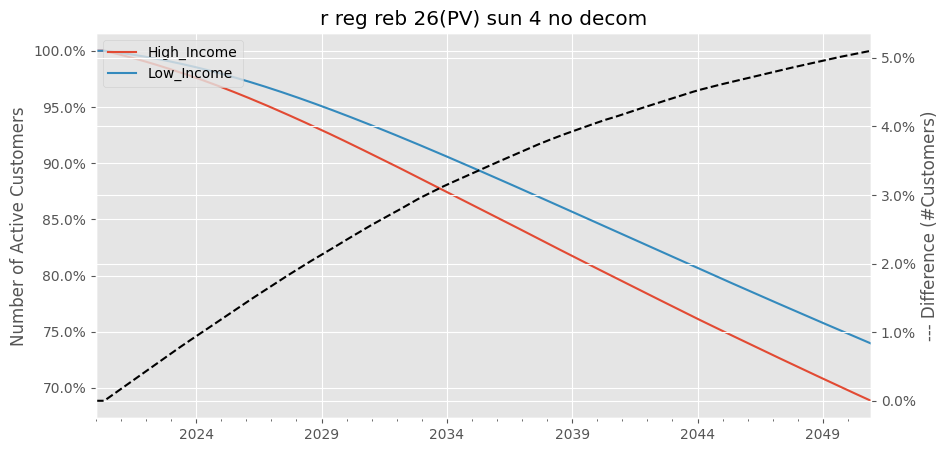

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1514255840.py:12: FutureWarning: 'm' is deprecated and will be removed in a future version, please use 'ME' instead.
  tmp = tmp.resample('m').mean()


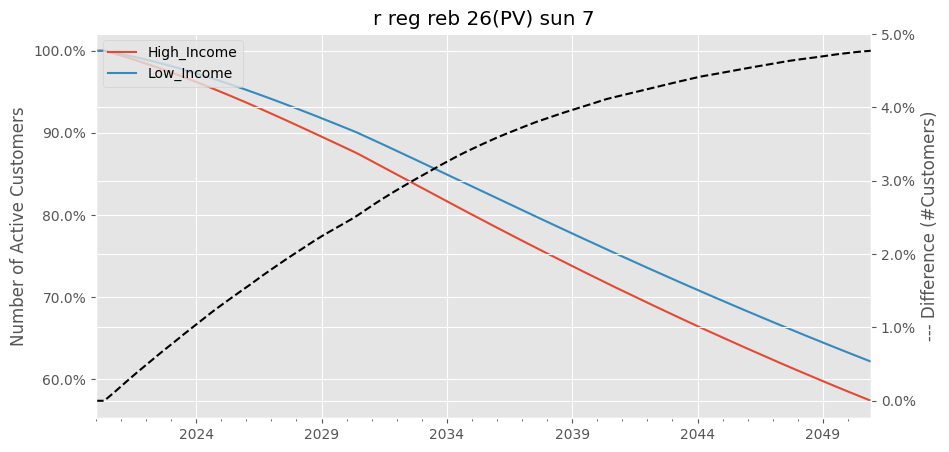

In [6]:
for s in simulations:
    plt.figure(figsize=(10,5), dpi=100)
    ax = plt.gca()
    tmp = pd.DataFrame(
        {
            income: pd.DataFrame({l.name: l.number_of_active_customers for l in s.lses if income in l.name}, index=s.time).sum(axis=1)
            for income in ["High_Income", "Low_Income"]
        },
        index=simulations[0].time
        )
    tmp = tmp / tmp.iloc[0] * 100
    tmp = tmp.resample('m').mean()

    tmp.plot(ax=ax)
    ax.legend(loc=2)
    ax.set_ylabel("Number of Active Customers")
    ax.yaxis.set_major_formatter(matplotlib.ticker.PercentFormatter())
    ax2 = ax.twinx()
    (tmp[tmp.columns[1]] - tmp[tmp.columns[0]]).plot(ax=ax2, color='k', style='--', label='Difference')
    ax2.set_ylabel("--- Difference (#Customers)")
    ax2.yaxis.set_major_formatter(matplotlib.ticker.PercentFormatter())
    plt.title(s.title)
    plt.show()

## Final Drop in Number of Residential Customers

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\3827911039.py:7: FutureWarning: 'm' is deprecated and will be removed in a future version, please use 'ME' instead.
  ).resample('m').mean()


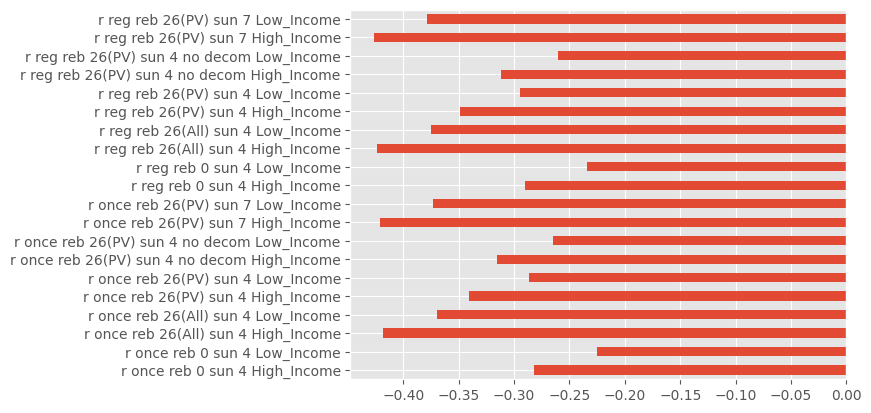

In [7]:
tmp = pd.DataFrame(
    {
        s.title + " " + income: pd.DataFrame({l.name: l.number_of_active_customers for l in s.lses if income in l.name and "Residential" in l.name}, index=s.time).sum(axis=1)
        for s in simulations for income in ['High_Income', 'Low_Income']
    },
    index=simulations[0].time
    ).resample('m').mean()
((tmp.iloc[-1] - tmp.iloc[0]) / tmp.iloc[0]).plot.barh()
plt.show()

## Ratio to Low to High Income

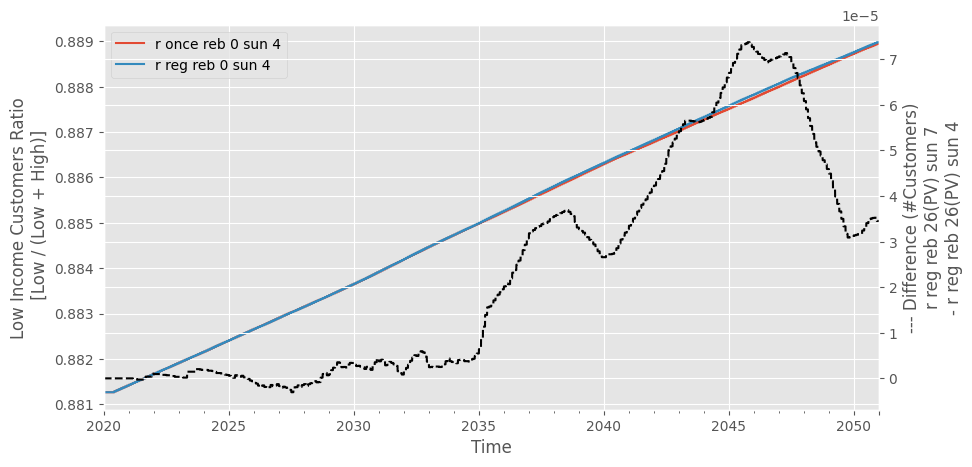

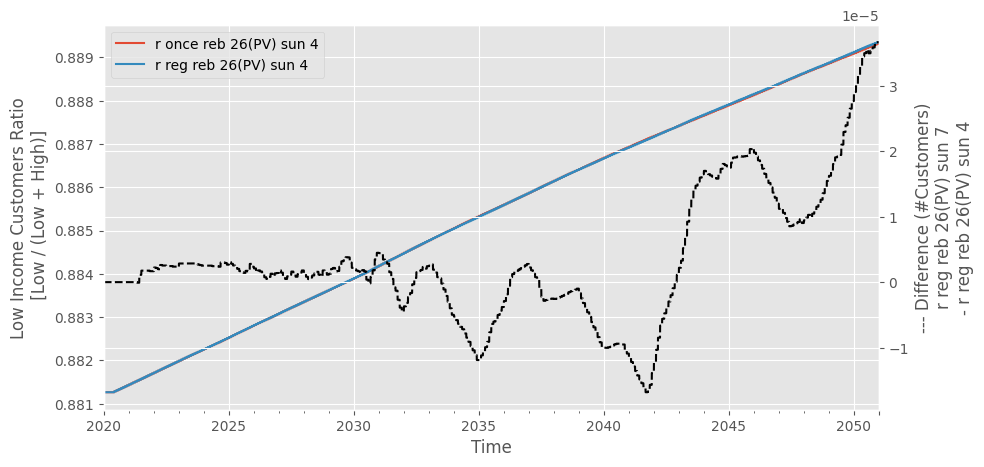

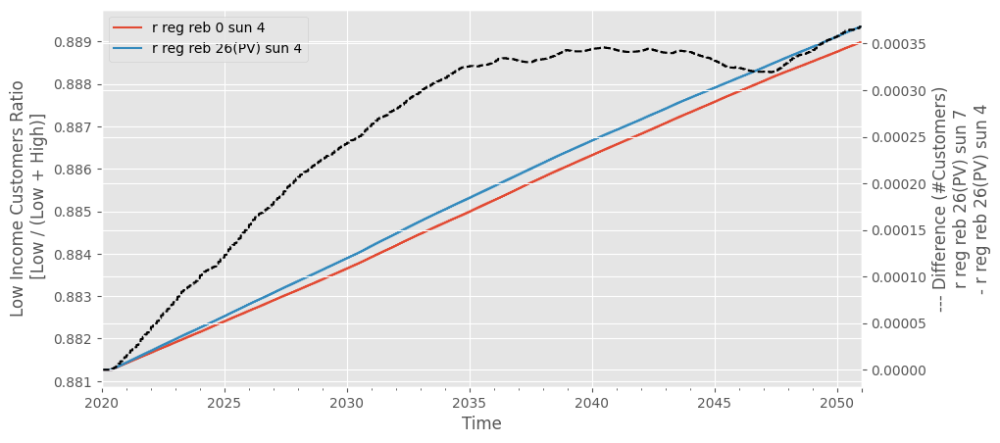

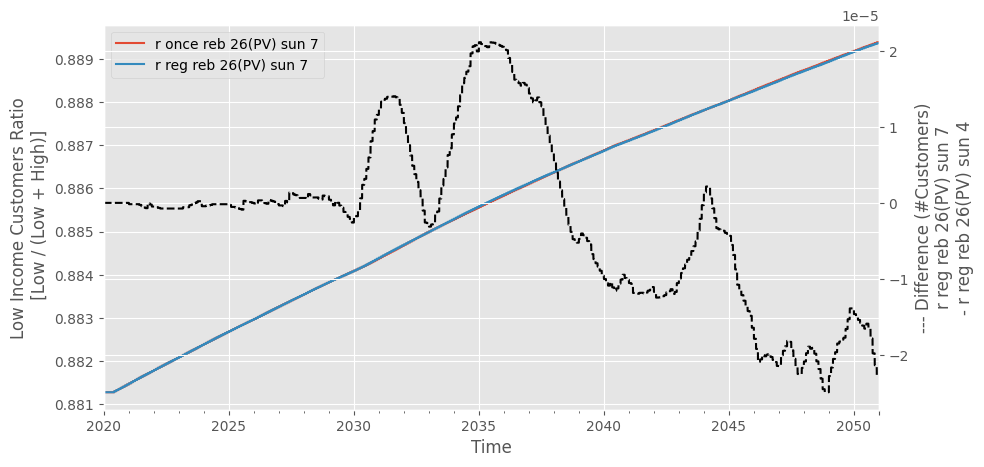

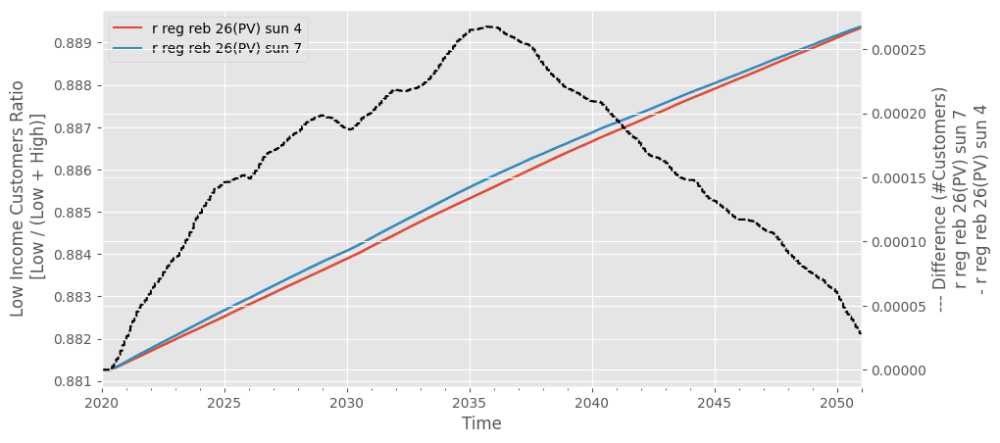

In [8]:
for c in comparisions:
    plt.figure(figsize=(10,5))
    ax = plt.gca()
    tmp = []
    for s in simulations:
        if s.title in c:
            tmp.append(
                pd.DataFrame({l.name: l.number_of_active_customers for l in s.lses if "Low_Income" in l.name}, index=s.time).sum(axis='columns') /
                (
                    pd.DataFrame({l.name: l.number_of_active_customers for l in s.lses if "High_Income" in l.name}, index=s.time).sum(axis='columns')
                    + pd.DataFrame({l.name: l.number_of_active_customers for l in s.lses if "Low_Income" in l.name}, index=s.time).sum(axis='columns')
                )
            )
            tmp[-1].plot(label=s.title)
    plt.xlabel("Time")
    plt.ylabel("Low Income Customers Ratio\n [Low / (Low + High)]")
    plt.legend()
    ax2 = ax.twinx()
    (tmp[1] - tmp[0]).plot(ax=ax2, color='k', style='--', label='Difference')
    ax2.set_ylabel(f"--- Difference (#Customers)\n{comparision[1]}\n- {comparision[0]}")
    plt.show()

# LSEs: Ramsey Prices

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\2729924829.py:6: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  ).resample('w').mean()
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\2729924829.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  tmp[i][pos],
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\2729924829.py:6: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  ).resample('w').mean()
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\2729924829.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
 

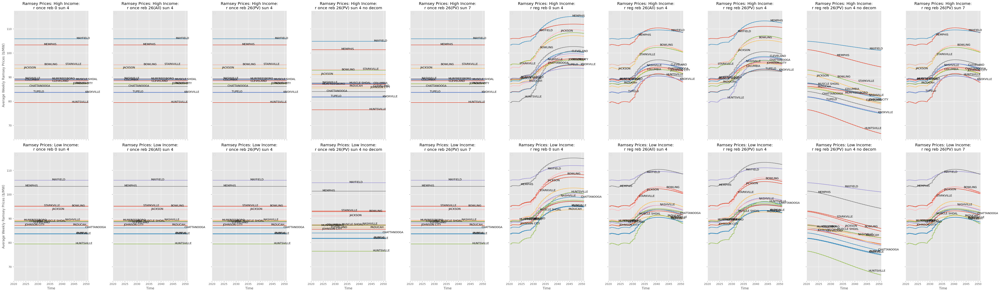

In [9]:
fig, axes = plt.subplots(nrows=2, ncols=len(simulations), figsize=(5*len(simulations) + 1,15), dpi=100, sharex=True, sharey=True, tight_layout=True)
for s, ax in zip(simulations, axes[0]):
    tmp = pd.DataFrame(
        {l.name: l.ramsey_price for l in s.lses if 'residential' in l.name.lower() and 'high_income' in l.name.lower()},
        index=simulations[0].time
    ).resample('w').mean()
    tmp = tmp[tmp.sum().sort_values(ascending=True).index]
    tmp.plot(ax=ax)
    rg = np.random.default_rng(10)
    for i in tmp.columns:
        pos = rg.choice(len(tmp.index))
        ax.annotate(
            text=i.split("_")[0],
            xy = (
                tmp.index[pos],
                tmp[i][pos],
            ),
            xycoords='data',
        )
    ax.set_title(f"Ramsey Prices: High Income:\n{s.title}")
    ax.legend([], loc=2)
    ax.set_xlabel("Time")
axes[0][0].set_ylabel("Average Weekly Ramsey Prices ($/MW)")

for s, ax in zip(simulations, axes[1]):
    tmp = pd.DataFrame(
        {l.name: l.ramsey_price for l in s.lses if 'residential' in l.name.lower() and 'low_income' in l.name.lower()},
        index=simulations[0].time
    ).resample('w').mean()
    tmp.plot(ax=ax)
    rg = np.random.default_rng(10)
    for i in tmp.columns:
        pos = rg.choice(len(tmp.index))
        ax.annotate(
            text=i.split("_")[0],
            xy = (
                tmp.index[pos],
                tmp[i][pos],
            ),
            xycoords='data',
        )
    ax.set_title(f"Ramsey Prices: Low Income:\n{s.title}")
    ax.legend([], loc=2)
    ax.set_xlabel("Time")
axes[1][0].set_ylabel("Average Weekly Ramsey Prices ($/MW)")
plt.show()

# LSEs: LMPs
Note: The LMPs are the same for LSEs in the same node.

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\996867423.py:6: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  ).resample('w').mean()
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\996867423.py:15: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  tmp[i][pos],
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\996867423.py:6: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  ).resample('w').mean()
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\996867423.py:15: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  tmp

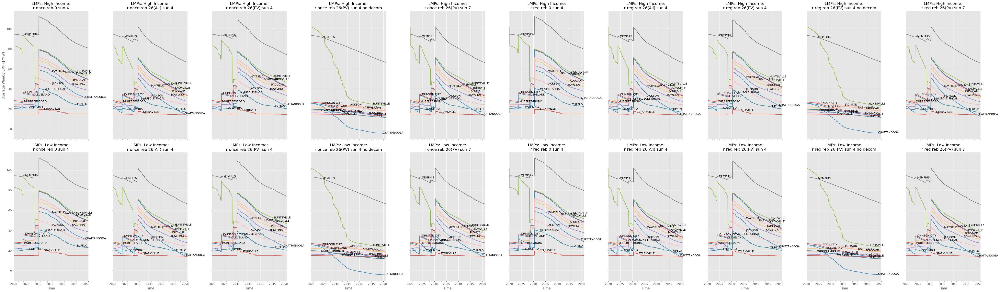

In [10]:
fig, axes = plt.subplots(nrows=2, ncols=len(simulations), figsize=(5*len(simulations)+1,15), dpi=100, sharex=True, sharey=True, tight_layout=True)
for s, ax in zip(simulations, axes[0]):
    tmp = pd.DataFrame(
        {l.name: l.node.lmp for l in s.lses if 'residential' in l.name.lower() and 'high_income' in l.name.lower()},
        index=simulations[0].time
    ).resample('w').mean()
    tmp.plot(ax=ax)
    rg = np.random.default_rng(10)
    for i in tmp.columns:
        pos = rg.choice(len(tmp.index))
        ax.annotate(
            text=i.split("_")[0],
            xy = (
                tmp.index[pos],
                tmp[i][pos],
            ),
            xycoords='data',
        )
    ax.set_title(f"LMPs: High Income:\n{s.title}")
    ax.legend([], loc=2, framealpha=0.3)
    ax.set_xlabel("Time")
axes[0][0].set_ylabel("Average Weekly LMP ($/MW)")

for s, ax in zip(simulations, axes[1]):
    tmp = pd.DataFrame(
        {l.name: l.node.lmp for l in s.lses if 'residential' in l.name.lower() and 'low_income' in l.name.lower()},
        index=simulations[0].time
    ).resample('w').mean()
    tmp.plot(ax=ax)
    rg = np.random.default_rng(10)
    for i in tmp.columns:
        pos = rg.choice(len(tmp.index))
        ax.annotate(
            text=i.split("_")[0],
            xy = (
                tmp.index[pos],
                tmp[i][pos],
            ),
            xycoords='data',
        )
    ax.set_title(f"LMPs: Low Income:\n{s.title}")
    ax.legend([], loc=2, framealpha=0.3)
    ax.set_xlabel("Time")
axes[0][1].set_ylabel("Average Weekly LMP ($/MW)")
plt.show()

# LSEs: Number of Customers

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\3518631590.py:6: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  ).resample('w').mean()
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\3518631590.py:15: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  tmp[i][pos],
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\3518631590.py:6: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  ).resample('w').mean()
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\3518631590.py:15: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
 

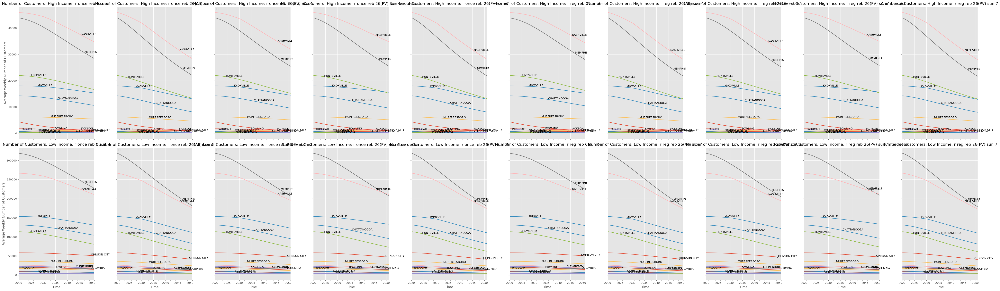

In [11]:
fig, axes = plt.subplots(nrows=2, ncols=len(simulations), figsize=(5*len(simulations)+1,15), dpi=100, sharex=True, sharey='row', tight_layout=True)
for s, ax in zip(simulations, axes[0]):
    tmp = pd.DataFrame(
        {l.name: l.number_of_active_customers for l in s.lses if 'residential' in l.name.lower() and 'high_income' in l.name.lower()},
        index=simulations[0].time
    ).resample('w').mean()
    tmp.plot(ax=ax)
    rg = np.random.default_rng(1)
    for i in tmp.columns:
        pos = rg.choice(len(tmp.index))
        ax.annotate(
            text=i.split("_")[0],
            xy = (
                tmp.index[pos],
                tmp[i][pos],
            ),
            xycoords='data',
        )
    ax.set_title(f"Number of Customers: High Income: {s.title}")
    ax.legend([], loc=2)
    ax.set_xlabel("Time")
axes[0][0].set_ylabel("Average Weekly Number of Customers")

for s, ax in zip(simulations, axes[1]):
    tmp = pd.DataFrame(
        {l.name: l.number_of_active_customers for l in s.lses if 'residential' in l.name.lower() and 'low_income' in l.name.lower()},
        index=simulations[0].time
    ).resample('w').mean()
    tmp.plot(ax=ax)
    rg = np.random.default_rng(1)
    for i in tmp.columns:
        pos = rg.choice(len(tmp.index))
        ax.annotate(
            text=i.split("_")[0],
            xy = (
                tmp.index[pos],
                tmp[i][pos],
            ),
            xycoords='data',
        )
    ax.set_title(f"Number of Customers: Low Income: {s.title}")
    ax.legend([], loc=2)
    ax.set_xlabel("Time")
axes[1][0].set_ylabel("Average Weekly Number of Customers")
plt.show()

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\773558862.py:6: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  ).resample('w').mean()
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\773558862.py:15: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  tmp[i][pos],
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\773558862.py:6: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  ).resample('w').mean()
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\773558862.py:15: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  tmp

Text(0, 0.5, 'Average Weekly Number of Customers')

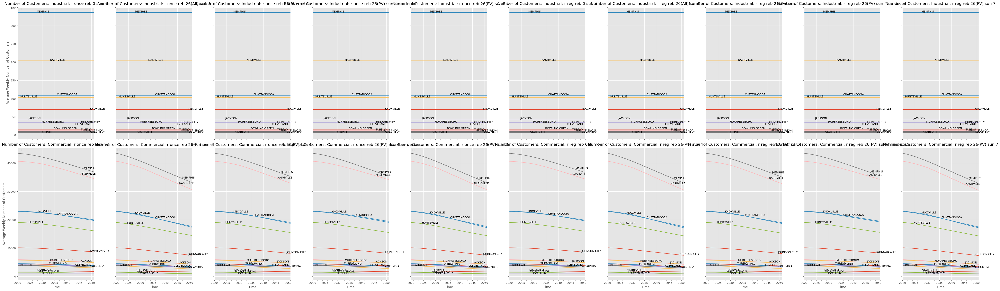

In [12]:
fig, axes = plt.subplots(nrows=2, ncols=len(simulations), figsize=(5*len(simulations)+1,15), dpi=100, sharex=True, sharey='row', tight_layout=True)
for s, ax in zip(simulations, axes[0]):
    tmp = pd.DataFrame(
        {l.name: l.number_of_active_customers for l in s.lses if 'industrial' in l.name.lower()},
        index=simulations[0].time
    ).resample('w').mean()
    tmp.plot(ax=ax)
    rg = np.random.default_rng(1)
    for i in tmp.columns:
        pos = rg.choice(len(tmp.index))
        ax.annotate(
            text=i.split("_")[0],
            xy = (
                tmp.index[pos],
                tmp[i][pos],
            ),
            xycoords='data',
        )
    ax.set_title(f"Number of Customers: Industrial: {s.title}")
    ax.legend([], loc=2)
    ax.set_xlabel("Time")
axes[0][0].set_ylabel("Average Weekly Number of Customers")

for s, ax in zip(simulations, axes[1]):
    tmp = pd.DataFrame(
        {l.name: l.number_of_active_customers for l in s.lses if 'commercial' in l.name.lower()},
        index=simulations[0].time
    ).resample('w').mean()
    tmp.plot(ax=ax)
    rg = np.random.default_rng(1)
    for i in tmp.columns:
        pos = rg.choice(len(tmp.index))
        ax.annotate(
            text=i.split("_")[0],
            xy = (
                tmp.index[pos],
                tmp[i][pos],
            ),
            xycoords='data',
        )
    ax.set_title(f"Number of Customers: Commercial: {s.title}")
    ax.legend([], loc=2)
    ax.set_xlabel("Time")
axes[1][0].set_ylabel("Average Weekly Number of Customers")

# LSEs: Cost per Customer Using Ramsey Price

$
Cost/Customer = \frac{Demand_{LSE} \times PriceRamsey_{LSE}}{NumberOfCustomer_{LSE}}
$

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\4197053169.py:6: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  ).resample('w').sum()
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\4197053169.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  tmp[i][pos],
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\4197053169.py:6: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  ).resample('w').sum()
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\4197053169.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  t

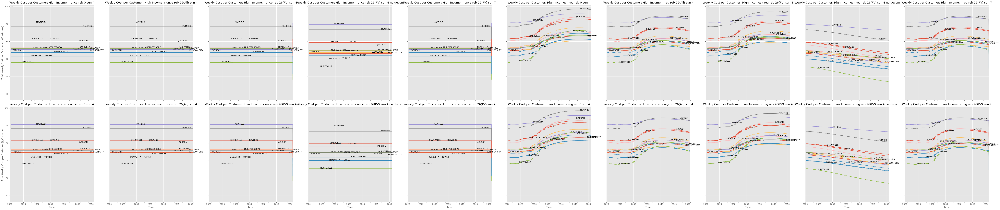

In [13]:
fig, axes = plt.subplots(nrows=2, ncols=len(simulations), figsize=(7*len(simulations)+1,15), dpi=100, sharex=True, sharey='row', tight_layout=True)
for s, ax in zip(simulations, axes[0]):
    tmp = pd.DataFrame(
        {l.name: l.ramsey_price * l.demand / l.number_of_active_customers for l in s.lses if 'residential' in l.name.lower() and 'high_income' in l.name.lower()},
        index=simulations[0].time
    ).resample('w').sum()
    tmp[tmp==0] = np.nan
    tmp.plot(ax=ax)
    rg = np.random.default_rng(1)
    for i in tmp.columns:
        pos = rg.choice(len(tmp.index))
        ax.annotate(
            text=i.split("_")[0],
            xy = (
                tmp.index[pos],
                tmp[i][pos],
            ),
            xycoords='data',
        )
    ax.set_title(f"Weekly Cost per Customer: High Income: {s.title}")
    ax.legend([], loc=2)
    ax.set_xlabel("Time")
axes[0][0].set_ylabel("Total Weekly Cost per Customer ($/Customer)")

for s, ax in zip(simulations, axes[1]):
    tmp = pd.DataFrame(
        {l.name: l.ramsey_price * l.demand / l.number_of_active_customers for l in s.lses if 'residential' in l.name.lower() and 'low_income' in l.name.lower()},
        index=simulations[0].time
    ).resample('w').sum()
    tmp[tmp==0] = np.nan
    tmp.plot(ax=ax)
    rg = np.random.default_rng(1)
    for i in tmp.columns:
        pos = rg.choice(len(tmp.index))
        ax.annotate(
            text=i.split("_")[0],
            xy = (
                tmp.index[pos],
                tmp[i][pos],
            ),
            xycoords='data',
        )
    ax.set_title(f"Weekly Cost per Customer: Low Income: {s.title}")
    ax.legend([], loc=2)
    ax.set_xlabel("Time")
axes[1][0].set_ylabel("Total Weekly Cost per Customer ($/Customer)")
plt.show()

# LSEs: Total Weekly Cost

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1520246437.py:6: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  ).resample('w').sum()
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1520246437.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  tmp[i][pos],
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1520246437.py:6: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  ).resample('w').sum()
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1520246437.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  t

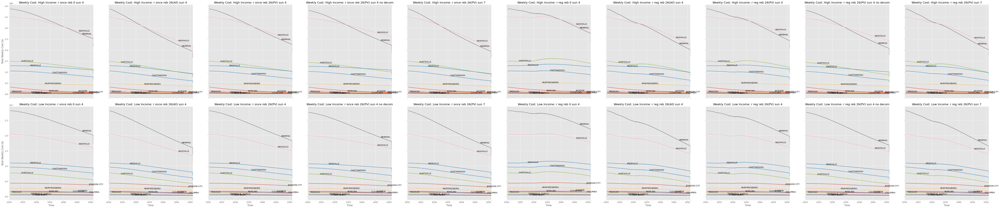

In [14]:
fig, axes = plt.subplots(nrows=2, ncols=len(simulations), figsize=(7*len(simulations)+1,15), dpi=100, sharex=True, sharey='row', tight_layout=True)
for s, ax in zip(simulations, axes[0]):
    tmp = pd.DataFrame(
        {l.name: l.ramsey_price * l.demand for l in s.lses if 'residential' in l.name.lower() and 'high_income' in l.name.lower()},
        index=simulations[0].time
    ).resample('w').sum()
    tmp[tmp==0] = np.nan
    tmp.plot(ax=ax)
    rg = np.random.default_rng(1)
    for i in tmp.columns:
        pos = rg.choice(len(tmp.index))
        ax.annotate(
            text=i.split("_")[0],
            xy = (
                tmp.index[pos],
                tmp[i][pos],
            ),
            xycoords='data',
        )
    ax.set_title(f"Weekly Cost: High Income: {s.title}")
    ax.legend([], loc=2)
    ax.set_xlabel("Time")
axes[0][0].set_ylabel("Total Weekly Cost ($)")

for s, ax in zip(simulations, axes[1]):
    tmp = pd.DataFrame(
        {l.name: l.ramsey_price * l.demand for l in s.lses if 'residential' in l.name.lower() and 'low_income' in l.name.lower()},
        index=simulations[0].time
    ).resample('w').sum()
    tmp[tmp==0] = np.nan
    tmp.plot(ax=ax)
    rg = np.random.default_rng(1)
    for i in tmp.columns:
        pos = rg.choice(len(tmp.index))
        ax.annotate(
            text=i.split("_")[0],
            xy = (
                tmp.index[pos],
                tmp[i][pos],
            ),
            xycoords='data',
        )
    ax.set_title(f"Weekly Cost: Low Income: {s.title}")
    ax.legend([], loc=2)
    ax.set_xlabel("Time")
axes[1][0].set_ylabel("Total Weekly Cost ($)")
plt.show()

# LSEs: Number of Customers: Percentage

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\2639325219.py:6: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  ).resample('w').mean()
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\2639325219.py:15: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  tmp[i][pos],
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\2639325219.py:6: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  ).resample('w').mean()
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\2639325219.py:15: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
 

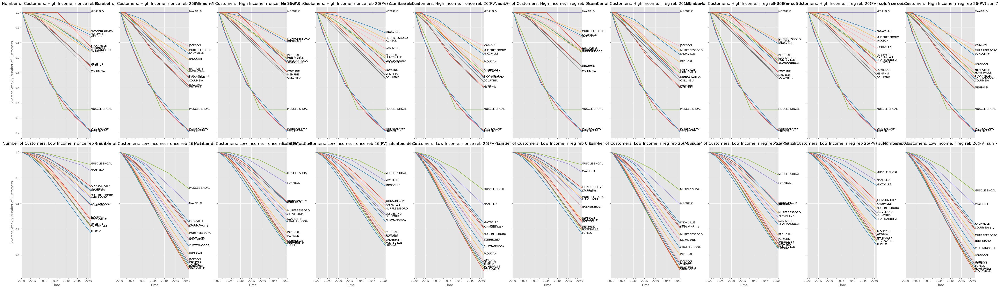

In [15]:
fig, axes = plt.subplots(nrows=2, ncols=len(simulations), figsize=(5*len(simulations)+1,15), dpi=100, sharex=True, sharey='row', tight_layout=True)
for s, ax in zip(simulations, axes[0]):
    tmp = pd.DataFrame(
        {l.name: l.number_of_active_customers / l.number_of_active_customers[0] for l in s.lses if 'residential' in l.name.lower() and 'high_income' in l.name.lower()},
        index=simulations[0].time
    ).resample('w').mean()
    tmp.plot(ax=ax)
    rg = np.random.default_rng(1)
    for i in tmp.columns:
        pos = -5
        ax.annotate(
            text=i.split("_")[0],
            xy = (
                tmp.index[pos],
                tmp[i][pos],
            ),
            xycoords='data',
        )
    ax.set_title(f"Number of Customers: High Income: {s.title}")
    ax.legend([], loc=2)
    ax.set_xlabel("Time")
axes[0][0].set_ylabel("Average Weekly Number of Customers")

for s, ax in zip(simulations, axes[1]):
    tmp = pd.DataFrame(
        {l.name: l.number_of_active_customers / l.number_of_active_customers[0] for l in s.lses if 'residential' in l.name.lower() and 'low_income' in l.name.lower()},
        index=simulations[0].time
    ).resample('w').mean()
    tmp.plot(ax=ax)
    rg = np.random.default_rng(1)
    for i in tmp.columns:
        pos = -5
        ax.annotate(
            text=i.split("_")[0],
            xy = (
                tmp.index[pos],
                tmp[i][pos],
            ),
            xycoords='data',
        )
    ax.set_title(f"Number of Customers: Low Income: {s.title}")
    ax.legend([], loc=2)
    ax.set_xlabel("Time")
axes[1][0].set_ylabel("Average Weekly Number of Customers")
plt.show()

# LSEs: Number of Customers: Percentage: By LSE

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1988063455.py:7: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  pd.Series(l.number_of_active_customers / l.number_of_active_customers[0], index=s.time).resample('w').mean().plot(ax=ax, label=l.name)
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1988063455.py:7: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  pd.Series(l.number_of_active_customers / l.number_of_active_customers[0], index=s.time).resample('w').mean().plot(ax=ax, label=l.name)
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1988063455.py:7: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  pd.Series(l.number_of_active_customers / l.number_of_active_customers[0], index=s.time).resample('w').mean().plot(ax=ax, label=l.name)
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1988063455.py:7: FutureWarning: 'w' is d

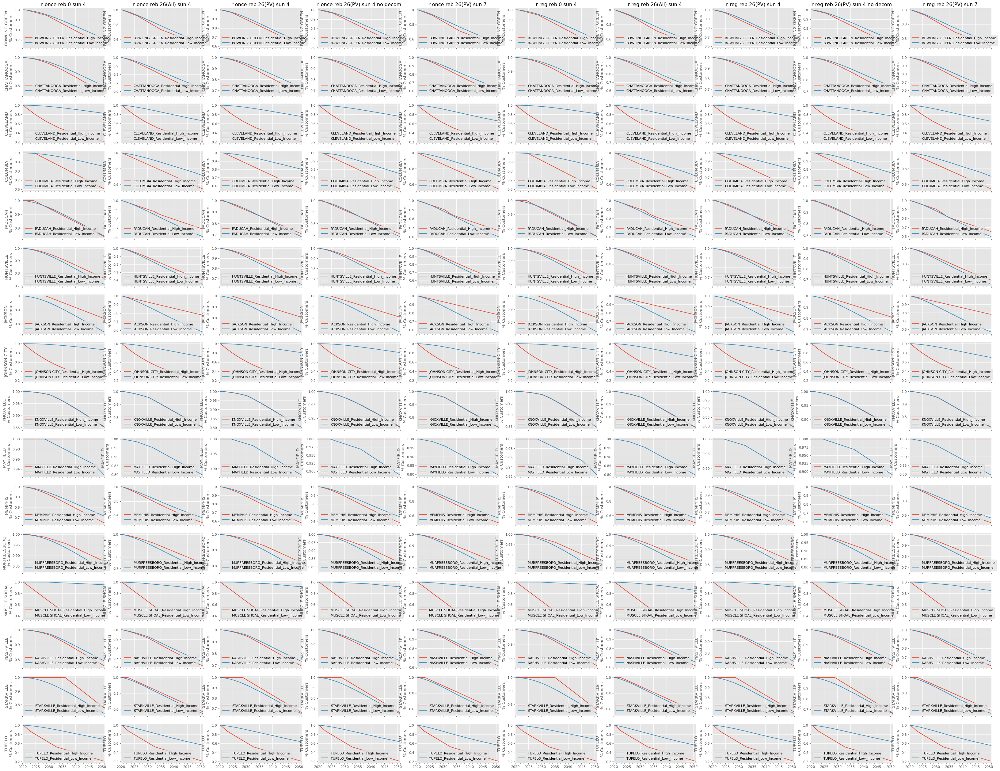

In [16]:
fig, axes = plt.subplots(nrows=len(simulations[0].nodes), ncols=len(simulations), figsize=(5*len(simulations)+1,40), dpi=80, sharex=True)
for s, axes_col in zip(simulations, axes.T):
    axes_col[0].set_title(s.title)
    for node, ax in zip(s.nodes, axes_col):
        for l in node.lses:
            if "Residential" in l.name:
                pd.Series(l.number_of_active_customers / l.number_of_active_customers[0], index=s.time).resample('w').mean().plot(ax=ax, label=l.name)
        ax.legend(loc=3)
        ax.set_ylabel(node.name + "\n" + '% Customers')
plt.show()

# LSEs: Total Cost for High vs Low

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\2853378097.py:14: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  tmp = tmp.resample('w').sum()


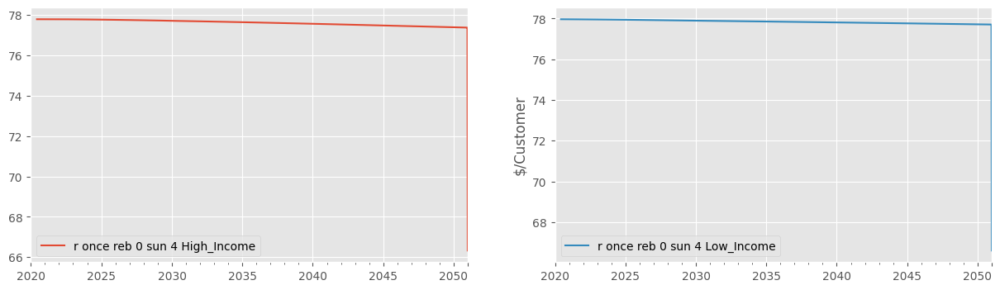

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\2853378097.py:14: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  tmp = tmp.resample('w').sum()


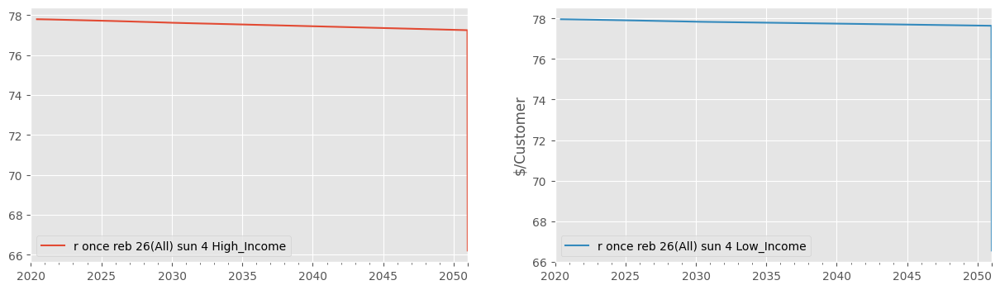

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\2853378097.py:14: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  tmp = tmp.resample('w').sum()


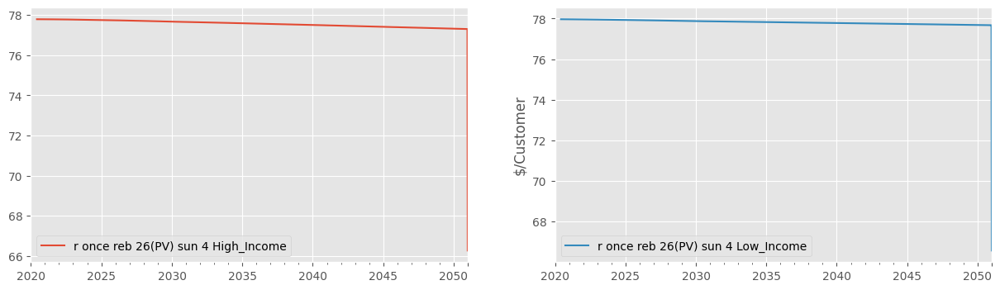

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\2853378097.py:14: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  tmp = tmp.resample('w').sum()


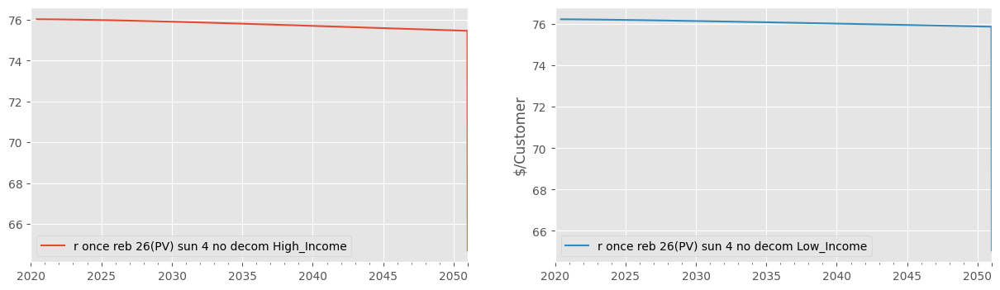

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\2853378097.py:14: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  tmp = tmp.resample('w').sum()


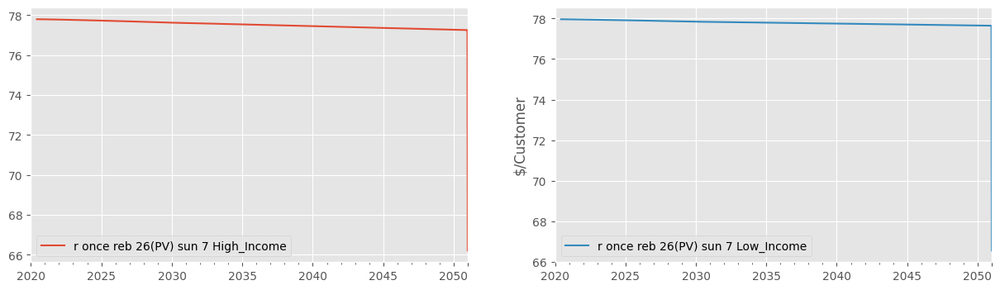

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\2853378097.py:14: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  tmp = tmp.resample('w').sum()


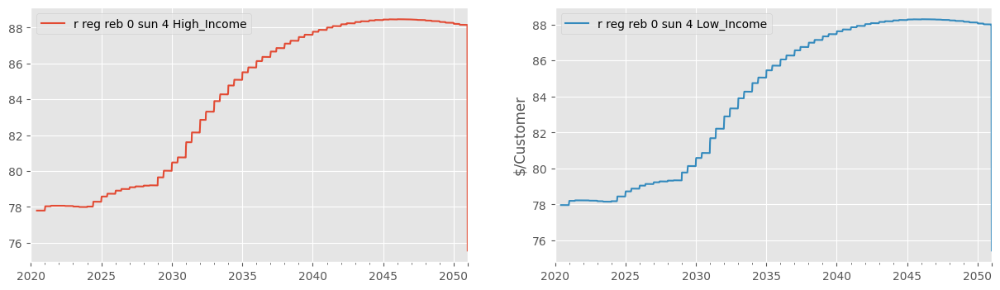

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\2853378097.py:14: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  tmp = tmp.resample('w').sum()


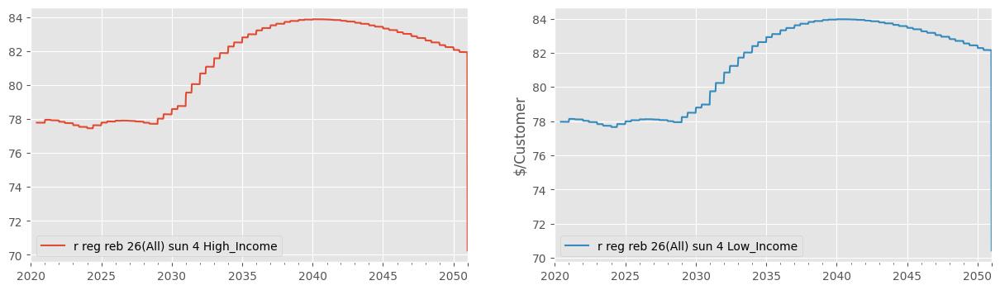

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\2853378097.py:14: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  tmp = tmp.resample('w').sum()


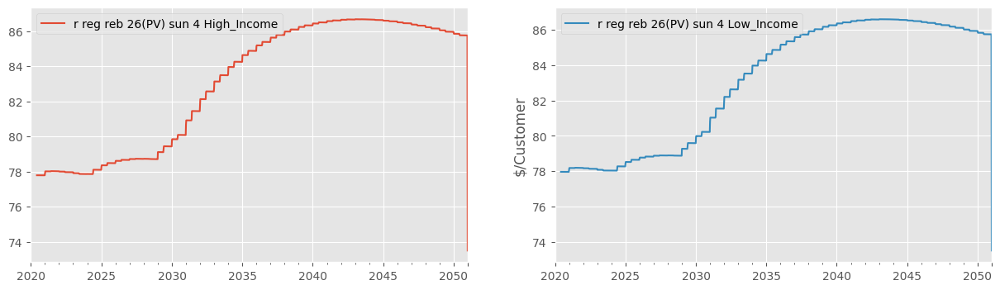

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\2853378097.py:14: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  tmp = tmp.resample('w').sum()


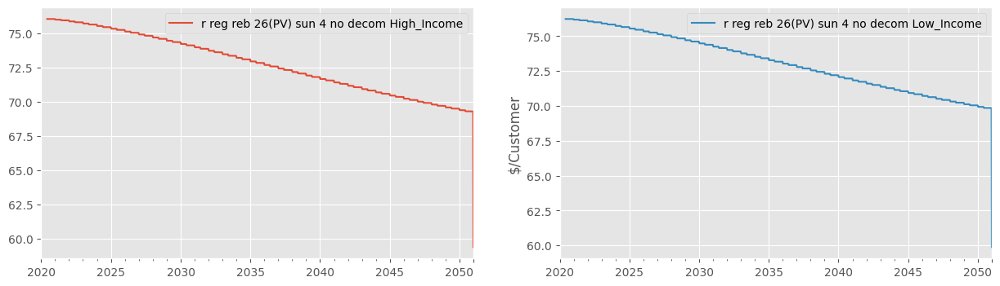

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\2853378097.py:14: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  tmp = tmp.resample('w').sum()


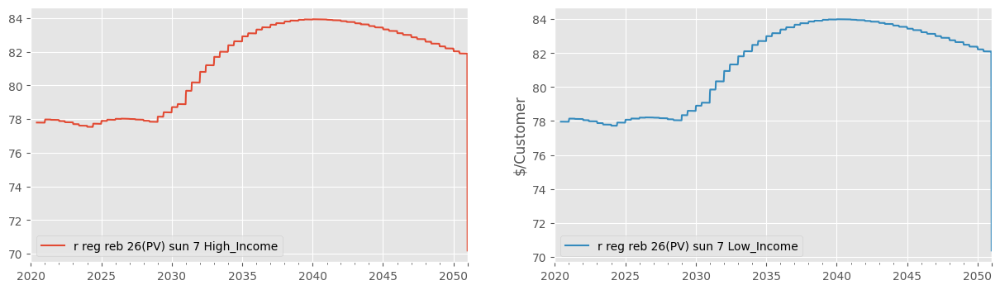

In [17]:
for s in simulations:
    tmp = pd.DataFrame(index=simulations[0].time)
    for income in ['High_Income', 'Low_Income']:
        tmp[s.title + " " + income] = (
            pd.DataFrame(
                {l.name: l.ramsey_price * l.demand for l in s.lses if income in l.name},
                index=s.time
            ).sum(axis=1)
            / pd.DataFrame(
                {l.name: l.number_of_active_customers for l in s.lses if income in l.name},
                index=s.time
            ).sum(axis=1)
        )
    tmp = tmp.resample('w').sum()
    tmp[tmp==0] = np.nan
    tmp.plot(figsize=(15,4), subplots=True, layout=(1,2))
    plt.gca().set_ylabel("$/Customer")
    plt.show()

# LSEs: Number of Customers: Final vs Initial

$
\%Change = \frac{Customers_{Final} - Customers_{Initial}}{Customers_{Initial}} \times 100
$

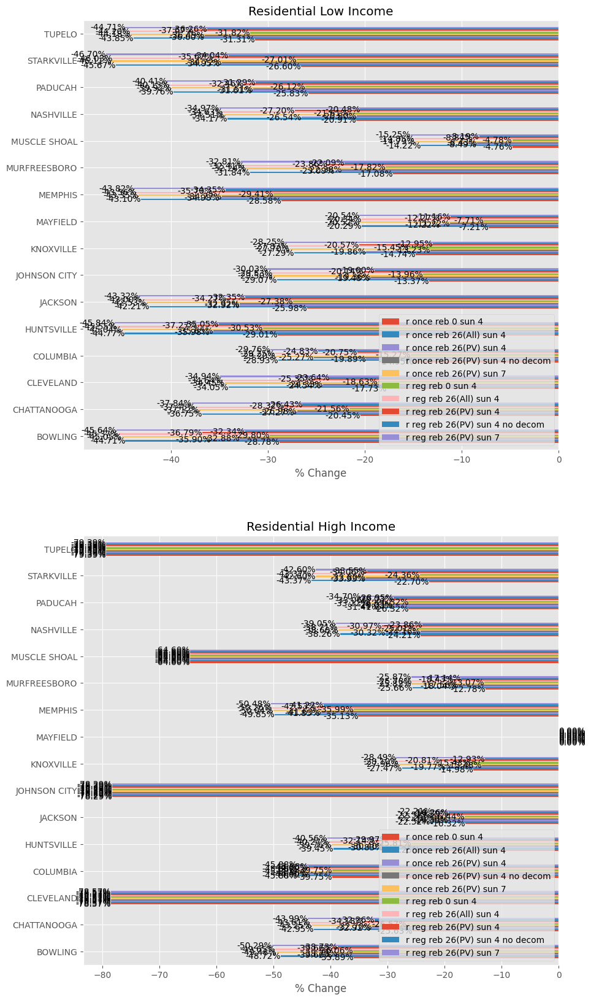

In [18]:
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10,20), dpi=100)
for ax, keyword in zip(axes, [
    "Residential_Low_Income",
    "Residential_High_Income",
]):
    pd.Series(
        {
            (s.title, l.name.split("_")[0]): (l.number_of_active_customers[-1] - l.number_of_active_customers[0]) / l.number_of_active_customers[0] * 100
            for s in simulations for l in s.lses if keyword in l.name
        }
    ).unstack().T.plot.barh(ax=ax)
    ax.set_xlabel("% Change")
    for i in ax.containers:
        ax.bar_label(i, label_type="edge", fmt='%.2f%%')
    ax.legend(loc=4)
    ax.set_title(keyword.replace("_", " "))
plt.show()

# Network: Total Number of Customers

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\768754957.py:6: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  ).resample('w').mean().sum(axis=1).plot(ax=plt.gca(), label=s.title)
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\768754957.py:6: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  ).resample('w').mean().sum(axis=1).plot(ax=plt.gca(), label=s.title)
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\768754957.py:6: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  ).resample('w').mean().sum(axis=1).plot(ax=plt.gca(), label=s.title)
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\768754957.py:6: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  ).resample('w').mean().sum(axis=1).plot(ax=plt.gca(), label=s.title)
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\76875

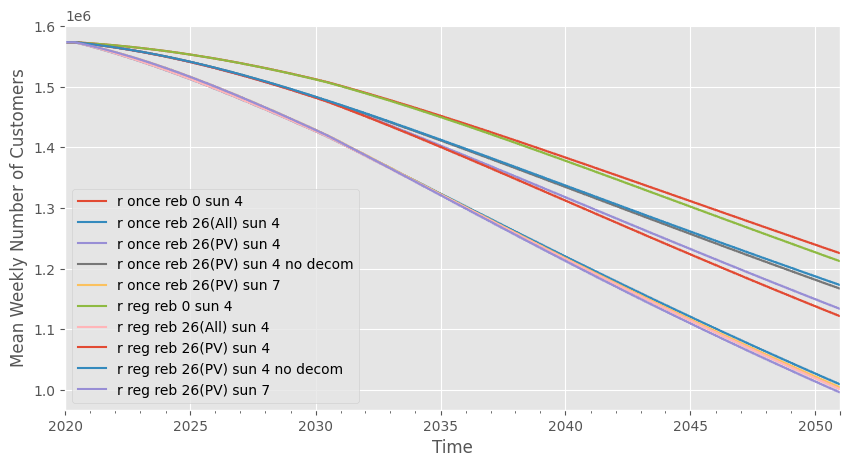

In [19]:
plt.figure(figsize=(10,5), dpi=100)
for s in simulations:
    pd.DataFrame(
        {l.name: l.number_of_active_customers for l in s.lses},
        index=s.time,
    ).resample('w').mean().sum(axis=1).plot(ax=plt.gca(), label=s.title)
plt.xlabel("Time")
plt.ylabel("Mean Weekly Number of Customers")
plt.legend()
plt.show()

In [20]:
tmp = {}
for s in simulations:
    tmp[s.title] = pd.DataFrame(
        {l.name: l.number_of_active_customers for l in s.lses},
        index=s.time,
    ).resample('a').min().sum(axis=1)
tmp = pd.DataFrame(tmp)
display(tmp)

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\236021423.py:6: FutureWarning: 'a' is deprecated and will be removed in a future version, please use 'YE' instead.
  ).resample('a').min().sum(axis=1)
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\236021423.py:6: FutureWarning: 'a' is deprecated and will be removed in a future version, please use 'YE' instead.
  ).resample('a').min().sum(axis=1)
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\236021423.py:6: FutureWarning: 'a' is deprecated and will be removed in a future version, please use 'YE' instead.
  ).resample('a').min().sum(axis=1)
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\236021423.py:6: FutureWarning: 'a' is deprecated and will be removed in a future version, please use 'YE' instead.
  ).resample('a').min().sum(axis=1)
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\236021423.py:6: FutureWarning: 'a' is deprecated and will be removed in a future version, please use 'YE' instead.
  ).resample('a').min().su

,r once reb 0 sun 4,r once reb 26(All) sun 4,r once reb 26(PV) sun 4,r once reb 26(PV) sun 4 no decom,r once reb 26(PV) sun 7,r reg reb 0 sun 4,r reg reb 26(All) sun 4,r reg reb 26(PV) sun 4,r reg reb 26(PV) sun 4 no decom,r reg reb 26(PV) sun 7
2020-12-31,1571911.0,1567322.0,1570765.0,1570800.0,1568201.0,1571911.0,1567322.0,1570765.0,1570800.0,1568201.0
2021-12-31,1568506.0,1555578.0,1565060.0,1565165.0,1557638.0,1568501.0,1555567.0,1565053.0,1565169.0,1557624.0
2022-12-31,1564304.0,1542546.0,1558226.0,1558418.0,1545486.0,1564291.0,1542532.0,1558209.0,1558430.0,1545469.0
2023-12-31,1559292.0,1528382.0,1550259.0,1550545.0,1531841.0,1559270.0,1528381.0,1550233.0,1550577.0,1531836.0
2024-12-31,1553432.0,1513269.0,1541220.0,1541604.0,1516953.0,1553397.0,1513281.0,1541186.0,1541671.0,1516952.0
2025-12-31,1546794.0,1497346.0,1531166.0,1531668.0,1501029.0,1546725.0,1497351.0,1531090.0,1531769.0,1501010.0
2026-12-31,1539386.0,1480692.0,1520239.0,1520837.0,1484173.0,1539261.0,1480676.0,1520105.0,1520997.0,1484131.0
2027-12-31,1531219.0,1463431.0,1508505.0,1509166.0,1466601.0,1531033.0,1463400.0,1508309.0,1509397.0,1466539.0
2028-12-31,1522387.0,1445681.0,1496046.0,1496793.0,1448425.0,1522128.0,1445646.0,1495777.0,1497110.0,1448346.0
2029-12-31,1512924.0,1427542.0,1482929.0,1483782.0,1429784.0,1512537.0,1427463.0,1482549.0,1484210.0,1429654.0


# Network: Number of Customers by Income

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\2503418222.py:8: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  ).resample('w').mean().sum(axis=1)
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\2503418222.py:8: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  ).resample('w').mean().sum(axis=1)
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\2503418222.py:8: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  ).resample('w').mean().sum(axis=1)
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\2503418222.py:8: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  ).resample('w').mean().sum(axis=1)
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\2503418222.py:8: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  ).resample('w').mean

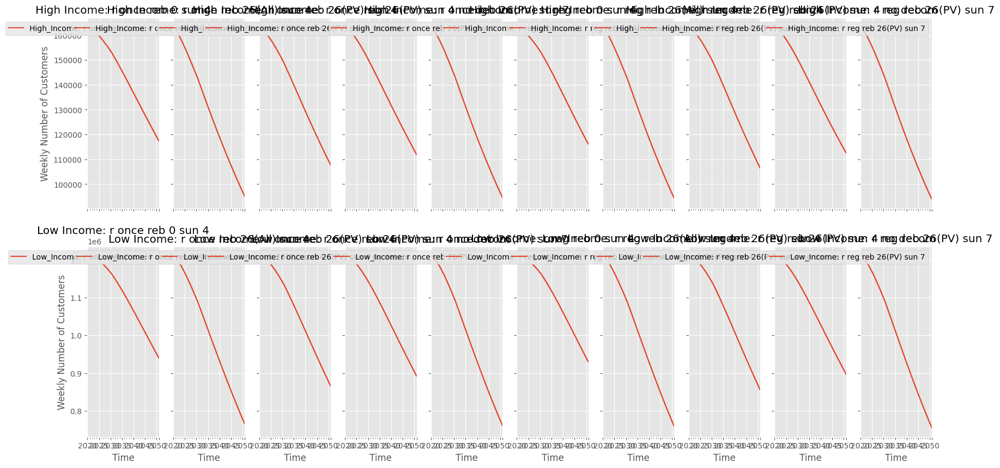

In [21]:
fig, axes = plt.subplots(ncols=len(simulations), nrows=2, figsize=(20,10), dpi=100, sharex=True, sharey='row')
for i, s in enumerate(simulations):
    for ii, income in enumerate(["High_Income", "Low_Income"]):
        ax = axes[ii][i]
        tmp = pd.DataFrame(
            {l.name: l.number_of_active_customers for l in s.lses if income in l.name},
            index=s.time,
        ).resample('w').mean().sum(axis=1)
        tmp.plot(ax=ax, label=f"{income}: {s.title}")
        ax.legend(loc=1)
        ax.set_title(f"{income.replace('_', ' ')}: {s.title}")
        ax.set_xlabel("Time")
        ax.set_ylabel("Weekly Number of Customers")
plt.show()

# Network: Number of Customers Final

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\3397297436.py:8: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  tmp = tmp.resample('w').mean()


High_Income: r once reb 0 sun 4                  0.281765
Low_Income: r once reb 0 sun 4                   0.225410
Industrial: r once reb 0 sun 4                   0.000000
Commercial: r once reb 0 sun 4                   0.144917
High_Income: r once reb 26(All) sun 4            0.418447
Low_Income: r once reb 26(All) sun 4             0.369751
Industrial: r once reb 26(All) sun 4             0.000000
Commercial: r once reb 26(All) sun 4             0.241137
High_Income: r once reb 26(PV) sun 4             0.341048
Low_Income: r once reb 26(PV) sun 4              0.286701
Industrial: r once reb 26(PV) sun 4              0.000000
Commercial: r once reb 26(PV) sun 4              0.184646
High_Income: r once reb 26(PV) sun 4 no decom    0.315157
Low_Income: r once reb 26(PV) sun 4 no decom     0.264501
Industrial: r once reb 26(PV) sun 4 no decom     0.000000
Commercial: r once reb 26(PV) sun 4 no decom     0.173372
High_Income: r once reb 26(PV) sun 7             0.421316
Low_Income: r 

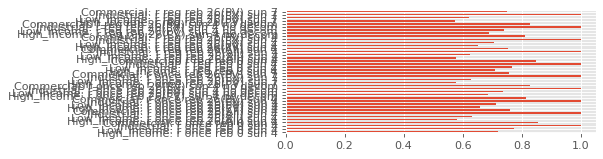

In [22]:
tmp = pd.DataFrame(index=simulations[0].time)
for i, s in enumerate(simulations):
    for ii, income in enumerate(["High_Income", "Low_Income", "Industrial", "Commercial"]):
        tmp[f"{income}: {s.title}"] = pd.DataFrame(
            {l.name: l.number_of_active_customers for l in s.lses if income in l.name},
            index=s.time,
        ).sum(axis=1)
tmp = tmp.resample('w').mean()
plt.figure(figsize=(5,2), dpi=80)
(tmp / tmp.iloc[0]).iloc[-1].plot.barh(ax=plt.gca())
# plt.xlim(0.70, 0.80)
display(
    (((tmp.iloc[0] - tmp) / tmp.iloc[0]).iloc[-1])
)
plt.show()

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\3995094014.py:8: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  tmp = tmp.resample('w').mean()


High_Income: r once reb 0 sun 4                  0.281765
Low_Income: r once reb 0 sun 4                   0.225410
High_Income: r once reb 26(All) sun 4            0.418447
Low_Income: r once reb 26(All) sun 4             0.369751
High_Income: r once reb 26(PV) sun 4             0.341048
Low_Income: r once reb 26(PV) sun 4              0.286701
High_Income: r once reb 26(PV) sun 4 no decom    0.315157
Low_Income: r once reb 26(PV) sun 4 no decom     0.264501
High_Income: r once reb 26(PV) sun 7             0.421316
Low_Income: r once reb 26(PV) sun 7              0.373030
High_Income: r reg reb 0 sun 4                   0.289951
Low_Income: r reg reb 0 sun 4                    0.233970
High_Income: r reg reb 26(All) sun 4             0.423421
Low_Income: r reg reb 26(All) sun 4              0.375129
High_Income: r reg reb 26(PV) sun 4              0.348818
Low_Income: r reg reb 26(PV) sun 4               0.294849
High_Income: r reg reb 26(PV) sun 4 no decom     0.311437
Low_Income: r 

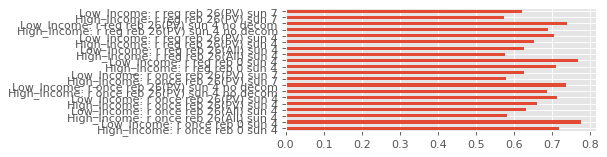

In [23]:
tmp = pd.DataFrame(index=simulations[0].time)
for i, s in enumerate(simulations):
    for ii, income in enumerate(["High_Income", "Low_Income"]):
        tmp[f"{income}: {s.title}"] = pd.DataFrame(
            {l.name: l.number_of_active_customers for l in s.lses if income in l.name},
            index=s.time,
        ).sum(axis=1)
tmp = tmp.resample('w').mean()
plt.figure(figsize=(5,2), dpi=80)
(tmp / tmp.iloc[0]).iloc[-1].plot.barh(ax=plt.gca())
# plt.xlim(0.70, 0.80)
display(
    (((tmp.iloc[0] - tmp) / tmp.iloc[0]).iloc[-1])
)
plt.show()

# Network: % Drop in Number of Customers

In [24]:
tmp = pd.DataFrame(index=simulations[0].time)
for i, s in enumerate(simulations):
    for ii, income in enumerate(["High_Income", "Low_Income"]):
        tmp[f"{income}: {s.title}"] = pd.DataFrame(
            {l.name: l.number_of_active_customers for l in s.lses if income in l.name},
            index=s.time,
        ).sum(axis=1)
tmp = ((tmp.iloc[0] - tmp) / tmp.iloc[0]).resample('y').max()
# tmp.to_excel("Network pct Number of Customers.xlsx")
tmp

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\3040674016.py:8: FutureWarning: 'y' is deprecated and will be removed in a future version, please use 'YE' instead.
  tmp = ((tmp.iloc[0] - tmp) / tmp.iloc[0]).resample('y').max()


,High_Income: r once reb 0 sun 4,Low_Income: r once reb 0 sun 4,High_Income: r once reb 26(All) sun 4,Low_Income: r once reb 26(All) sun 4,High_Income: r once reb 26(PV) sun 4,Low_Income: r once reb 26(PV) sun 4,High_Income: r once reb 26(PV) sun 4 no decom,Low_Income: r once reb 26(PV) sun 4 no decom,High_Income: r once reb 26(PV) sun 7,Low_Income: r once reb 26(PV) sun 7,High_Income: r reg reb 0 sun 4,Low_Income: r reg reb 0 sun 4,High_Income: r reg reb 26(All) sun 4,Low_Income: r reg reb 26(All) sun 4,High_Income: r reg reb 26(PV) sun 4,Low_Income: r reg reb 26(PV) sun 4,High_Income: r reg reb 26(PV) sun 4 no decom,Low_Income: r reg reb 26(PV) sun 4 no decom,High_Income: r reg reb 26(PV) sun 7,Low_Income: r reg reb 26(PV) sun 7
2020-12-31,0.002300,0.000926,0.005733,0.003966,0.003187,0.001686,0.003163,0.001662,0.005090,0.003380,0.002300,0.000926,0.005733,0.003966,0.003187,0.001686,0.003163,0.001662,0.005090,0.003380
2021-12-31,0.006626,0.002921,0.016200,0.011496,0.009275,0.005180,0.009214,0.005106,0.014757,0.010102,0.006638,0.002924,0.016207,0.011501,0.009293,0.005182,0.009208,0.005103,0.014763,0.010113
2022-12-31,0.011471,0.005444,0.027409,0.019880,0.016115,0.009444,0.016005,0.009309,0.025371,0.017913,0.011483,0.005453,0.027421,0.019888,0.016145,0.009453,0.015999,0.009301,0.025377,0.017927
2023-12-31,0.016818,0.008513,0.039271,0.029021,0.023634,0.014462,0.023456,0.014263,0.036910,0.026709,0.016849,0.008526,0.039284,0.029021,0.023671,0.014475,0.023444,0.014243,0.036910,0.026713
2024-12-31,0.022777,0.012137,0.051691,0.038805,0.031863,0.020203,0.031612,0.019935,0.049177,0.036340,0.022808,0.012161,0.051673,0.038798,0.031905,0.020221,0.031563,0.019893,0.049177,0.036342
2025-12-31,0.029238,0.016299,0.064502,0.049161,0.040813,0.026623,0.040416,0.026281,0.061981,0.046702,0.029281,0.016349,0.064484,0.049160,0.040881,0.026669,0.040342,0.026216,0.061994,0.046714
2026-12-31,0.036157,0.020978,0.077766,0.060014,0.050241,0.033652,0.049782,0.033240,0.075411,0.057687,0.036231,0.021065,0.077766,0.060025,0.050339,0.033739,0.049660,0.033136,0.075435,0.057713
2027-12-31,0.043530,0.026158,0.091342,0.071282,0.060171,0.041228,0.059651,0.040770,0.089207,0.069169,0.043640,0.026284,0.091342,0.071303,0.060311,0.041355,0.059491,0.040618,0.089249,0.069207
2028-12-31,0.051336,0.031790,0.105205,0.082882,0.070504,0.049282,0.069886,0.048774,0.103302,0.081054,0.051514,0.031965,0.105211,0.082906,0.070687,0.049459,0.069672,0.048565,0.103358,0.081102
2029-12-31,0.059589,0.037854,0.119124,0.094755,0.081235,0.057770,0.080519,0.057205,0.117502,0.093261,0.059871,0.038110,0.119136,0.094810,0.081498,0.058020,0.080225,0.056922,0.117564,0.093346


# Network: Number of Customers (Ratio) by Income

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\496696728.py:7: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  ).resample('w').mean().sum(axis=1)
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\496696728.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  tmp = tmp / tmp[0]
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\496696728.py:7: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  ).resample('w').mean().sum(axis=1)
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\496696728.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by positio

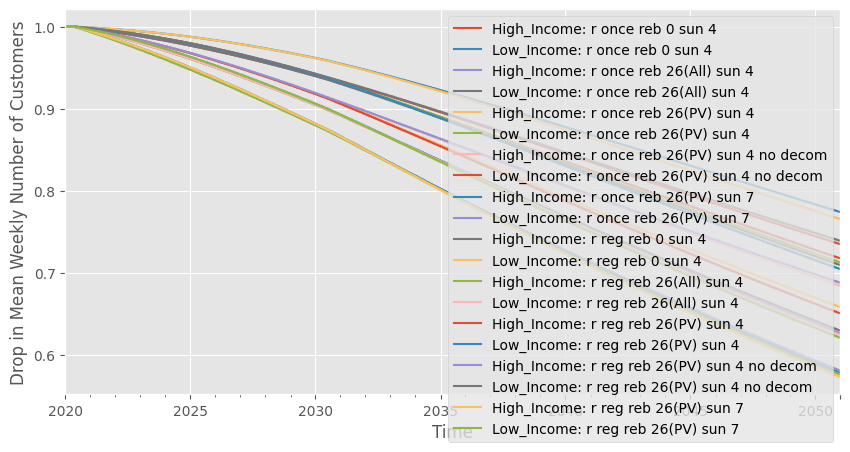

In [25]:
plt.figure(figsize=(10,5), dpi=100)
for s in simulations:
    for income in ["High_Income", "Low_Income"]:
        tmp = pd.DataFrame(
            {l.name: l.number_of_active_customers for l in s.lses if income in l.name},
            index=s.time,
        ).resample('w').mean().sum(axis=1)
        tmp = tmp / tmp[0]
        tmp.plot(ax=plt.gca(), label=f"{income}: {s.title}")
plt.xlabel("Time")
plt.ylabel("Drop in Mean Weekly Number of Customers")
plt.legend()
plt.show()

# Network: Total Generation

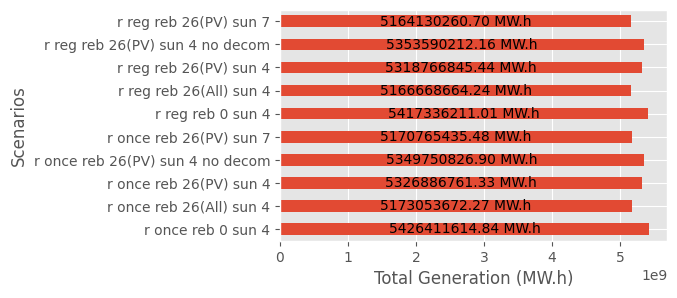

In [26]:
pd.Series({
    s.title: np.sum([g.generation for g in s.generators]) for s in simulations
}).plot.barh(figsize=(5,3))
plt.xlabel("Total Generation (MW.h)")
plt.ylabel("Scenarios")
for i in plt.gca().containers:
    plt.gca().bar_label(i, label_type="center", fmt='%.2f MW.h')

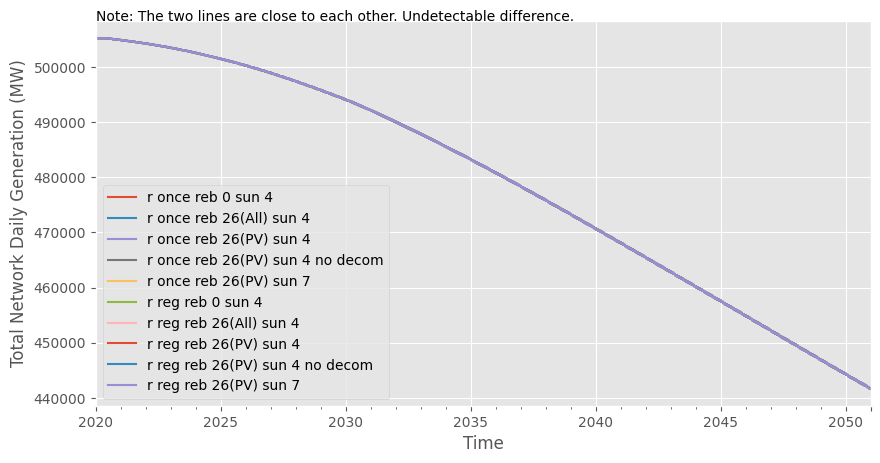

In [27]:
plt.figure(figsize=(10, 5))
for s in simulations:
    pd.DataFrame(
        {g.name: g.generation for g in simulations[0].generators},
        index=s.time,
    ).resample('d').sum().sum(axis='columns').plot(ax=plt.gca(), label=s.title)
# plt.gca().set_yscale('log')
plt.legend()
plt.xlabel("Time")
plt.ylabel("Total Network Daily Generation (MW)")
plt.annotate(
    "Note: The two lines are close to each other. Undetectable difference.", 
    xy = (plt.xlim()[0], plt.ylim()[1]),
)
plt.show()

# Network: Total Cost (Daily)
Note: 
 - Calculated as $ \sum_{g}{a_g \times P_g + b_g \times P_g^2} $
 - The two lines are close to each other. Undetectable difference.

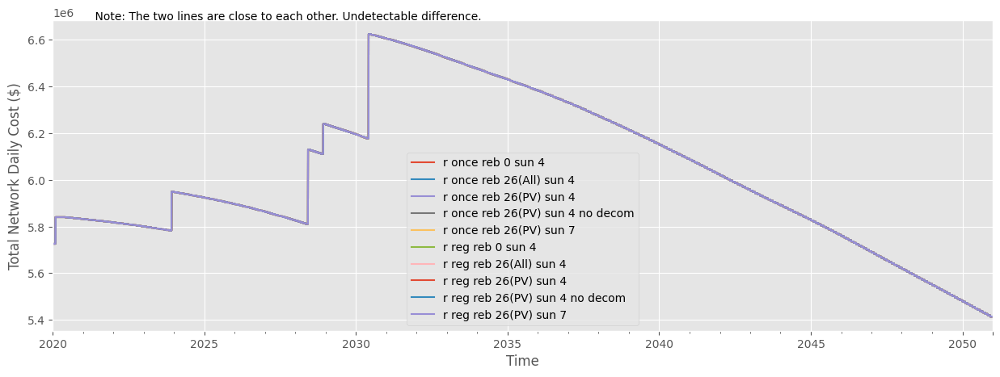

In [28]:
plt.figure(figsize=(15, 5))
for s in simulations:
    pd.DataFrame(
        {g.name: g.a * g.generation + g.b * g.generation**2 for g in simulations[0].generators},
        index=s.time,
    ).resample('d').sum().sum(axis='columns').plot(ax=plt.gca(), label=s.title)
# plt.gca().set_yscale('log')
plt.legend()
plt.xlabel("Time")
plt.ylabel("Total Network Daily Cost ($)")
plt.annotate(
    "            Note: The two lines are close to each other. Undetectable difference.", 
    xy = (plt.xlim()[0], plt.ylim()[1]),
)
plt.show()

# Network: Total Cost (Yearly)

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1785715412.py:7: FutureWarning: 'y' is deprecated and will be removed in a future version, please use 'YE' instead.
  ).resample('y').sum().sum(axis='columns')
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1785715412.py:7: FutureWarning: 'y' is deprecated and will be removed in a future version, please use 'YE' instead.
  ).resample('y').sum().sum(axis='columns')
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1785715412.py:7: FutureWarning: 'y' is deprecated and will be removed in a future version, please use 'YE' instead.
  ).resample('y').sum().sum(axis='columns')
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1785715412.py:7: FutureWarning: 'y' is deprecated and will be removed in a future version, please use 'YE' instead.
  ).resample('y').sum().sum(axis='columns')
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1785715412.py:7: FutureWarning: 'y' is deprecated and will be removed in a future version, please use 'YE

,r once reb 0 sun 4,r once reb 26(All) sun 4,r once reb 26(PV) sun 4,r once reb 26(PV) sun 4 no decom,r once reb 26(PV) sun 7,r reg reb 0 sun 4,r reg reb 26(All) sun 4,r reg reb 26(PV) sun 4,r reg reb 26(PV) sun 4 no decom,r reg reb 26(PV) sun 7
2020-12-31,2.133020e+09,2.133020e+09,2.133020e+09,2.133020e+09,2.133020e+09,2.133020e+09,2.133020e+09,2.133020e+09,2.133020e+09,2.133020e+09
2021-12-31,2.126100e+09,2.126100e+09,2.126100e+09,2.126100e+09,2.126100e+09,2.126100e+09,2.126100e+09,2.126100e+09,2.126100e+09,2.126100e+09
2022-12-31,2.120343e+09,2.120343e+09,2.120343e+09,2.120343e+09,2.120343e+09,2.120343e+09,2.120343e+09,2.120343e+09,2.120343e+09,2.120343e+09
2023-12-31,2.118720e+09,2.118720e+09,2.118720e+09,2.118720e+09,2.118720e+09,2.118720e+09,2.118720e+09,2.118720e+09,2.118720e+09,2.118720e+09
2024-12-31,2.172572e+09,2.172572e+09,2.172572e+09,2.172572e+09,2.172572e+09,2.172572e+09,2.172572e+09,2.172572e+09,2.172572e+09,2.172572e+09
2025-12-31,2.157260e+09,2.157260e+09,2.157260e+09,2.157260e+09,2.157260e+09,2.157260e+09,2.157260e+09,2.157260e+09,2.157260e+09,2.157260e+09
2026-12-31,2.146308e+09,2.146308e+09,2.146308e+09,2.146308e+09,2.146308e+09,2.146308e+09,2.146308e+09,2.146308e+09,2.146308e+09,2.146308e+09
2027-12-31,2.133395e+09,2.133395e+09,2.133395e+09,2.133395e+09,2.133395e+09,2.133395e+09,2.133395e+09,2.133395e+09,2.133395e+09,2.133395e+09
2028-12-31,2.197655e+09,2.197655e+09,2.197655e+09,2.197655e+09,2.197655e+09,2.197655e+09,2.197655e+09,2.197655e+09,2.197655e+09,2.197655e+09
2029-12-31,2.268843e+09,2.268843e+09,2.268843e+09,2.268843e+09,2.268843e+09,2.268843e+09,2.268843e+09,2.268843e+09,2.268843e+09,2.268843e+09


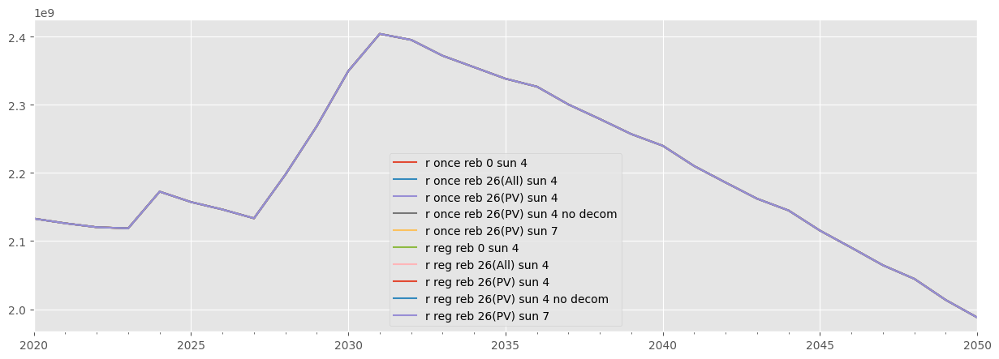

In [29]:
plt.figure(figsize=(15, 5))
tmp = pd.concat(
    [
        pd.DataFrame(
            {g.name: g.a * g.generation + g.b * g.generation**2 for g in simulations[0].generators},
            index=s.time,
        ).resample('y').sum().sum(axis='columns')
        for s in simulations
    ],
    axis='columns',
)
tmp.columns = [i.title for i in simulations]
display(tmp)
tmp.plot(ax=plt.gca())
plt.show()

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1507013264.py:6: FutureWarning: 'y' is deprecated and will be removed in a future version, please use 'YE' instead.
  ).resample('y').sum().sum(axis='columns').plot(ax=plt.gca(), label=s.title)
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1507013264.py:6: FutureWarning: 'y' is deprecated and will be removed in a future version, please use 'YE' instead.
  ).resample('y').sum().sum(axis='columns').plot(ax=plt.gca(), label=s.title)
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1507013264.py:6: FutureWarning: 'y' is deprecated and will be removed in a future version, please use 'YE' instead.
  ).resample('y').sum().sum(axis='columns').plot(ax=plt.gca(), label=s.title)
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1507013264.py:6: FutureWarning: 'y' is deprecated and will be removed in a future version, please use 'YE' instead.
  ).resample('y').sum().sum(axis='columns').plot(ax=plt.gca(), label=s.title)
C:\Users\vtt513\AppD

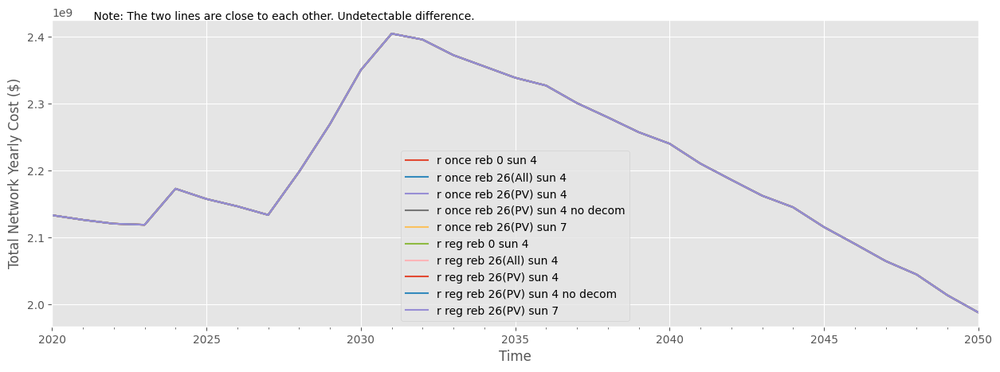

In [30]:
plt.figure(figsize=(15, 5))
for s in simulations:
    pd.DataFrame(
        {g.name: g.a * g.generation + g.b * g.generation**2 for g in simulations[0].generators},
        index=s.time,
    ).resample('y').sum().sum(axis='columns').plot(ax=plt.gca(), label=s.title)
# plt.gca().set_yscale('log')
plt.legend()
plt.xlabel("Time")
plt.ylabel("Total Network Yearly Cost ($)")
plt.annotate(
    "            Note: The two lines are close to each other. Undetectable difference.", 
    xy = (plt.xlim()[0], plt.ylim()[1]),
)
plt.show()

# Plants: Generation

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1664062647.py:6: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  ).resample('w').sum()
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1664062647.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  tmp[i][pos]
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1664062647.py:6: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  ).resample('w').sum()
C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1664062647.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  tm

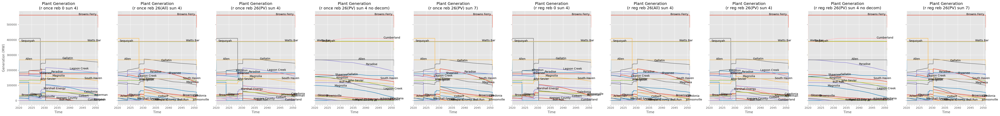

In [31]:
fig, axes = plt.subplots(nrows=1, ncols=len(simulations), figsize=(5*len(simulations)+1,6), dpi=100, sharex=True, sharey=True, tight_layout=True)
for s, ax in zip(simulations, axes):
    tmp = pd.DataFrame(
        {p.name: np.sum([g.generation for g in p.generators], axis=0) for p in s.plants},
        index=s.time
    ).resample('w').sum()
    tmp = tmp[tmp.sum().sort_values().index]
    tmp.plot(ax=ax)
    rng = np.random.default_rng(1)
    for i in tmp.columns:
        pos = rng.choice(len(tmp.index))
        ax.annotate(
            text=i,
            xy= (
                tmp.index[pos],
                tmp[i][pos]
            )
        )
    ax.set_title(f"Plant Generation\n({s.title})")
    ax.legend([], loc=2)
    ax.set_xlabel("Time")
axes[0].set_ylabel("Generation (MW)")
plt.show()

# Plants: Total Generation

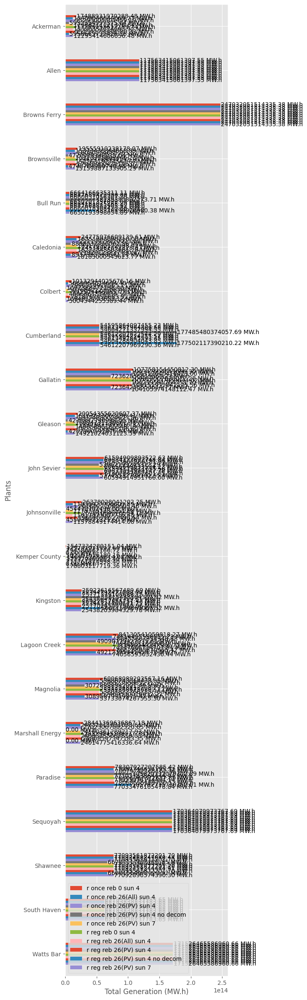

In [32]:
pd.DataFrame(
    {(s.title, p.name): np.sum(np.sum([g.generation for g in p.generators], axis=0)) for s in simulations for p in s.plants},
    index=s.time
).sum().unstack().T.plot.barh(figsize=(5,30))
plt.gca().invert_yaxis()
plt.xlabel("Total Generation (MW.h)")
plt.ylabel("Plants")
for i in plt.gca().containers:
    plt.gca().bar_label(i, label_type="edge", padding=1, fmt='%.2f MW.h')
plt.legend(loc=3)
plt.show()

# Plants: Generation vs. Expected (At Hour 0)

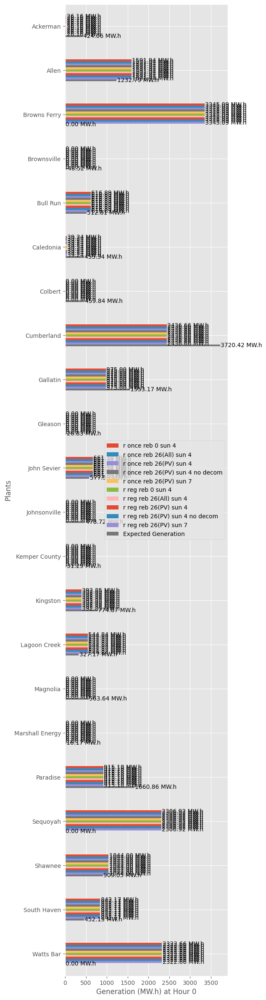

In [33]:
pd.concat(
    [
        pd.Series(
            {
                (s.title, p.name): 
                np.sum([g.generation[0] for g in p.generators])
                for s in simulations for p in s.plants
            }
        ).unstack().T,
        pd.Series(
            {
                ("Expected Generation", p.name): 
                p.expected_daily_generation/24
                for p in s.plants
            }
        ).unstack().T
    ],
    axis=1
).plot.barh(figsize=(5,30))
plt.gca().invert_yaxis()
plt.xlabel("Generation (MW.h) at Hour 0")
plt.ylabel("Plants")
for i in plt.gca().containers:
    plt.gca().bar_label(i, label_type="edge", padding=1, fmt='%.2f MW.h')
plt.show() 

# Plants: Generation vs. Expected (At Hour 15)

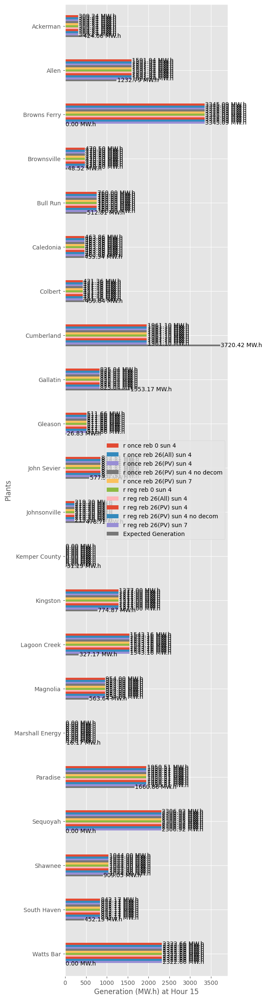

In [34]:
pd.concat(
    [
        pd.Series(
            {
                (s.title, p.name): 
                np.sum([g.generation[15] for g in p.generators])
                for s in simulations for p in s.plants
            }
        ).unstack().T,
        pd.Series(
            {
                ("Expected Generation", p.name): 
                p.expected_daily_generation/24
                for p in s.plants
            }
        ).unstack().T
    ],
    axis=1
).plot.barh(figsize=(5,30))
plt.gca().invert_yaxis()
plt.xlabel("Generation (MW.h) at Hour 15")
plt.ylabel("Plants")
for i in plt.gca().containers:
    plt.gca().bar_label(i, label_type="edge", padding=1, fmt='%.2f MW.h')
plt.show() 

# Generators: Supply Curve
Possible Error: This is not considering Minimum Capacities ...  
Also: Note: Does not include Extra Generator

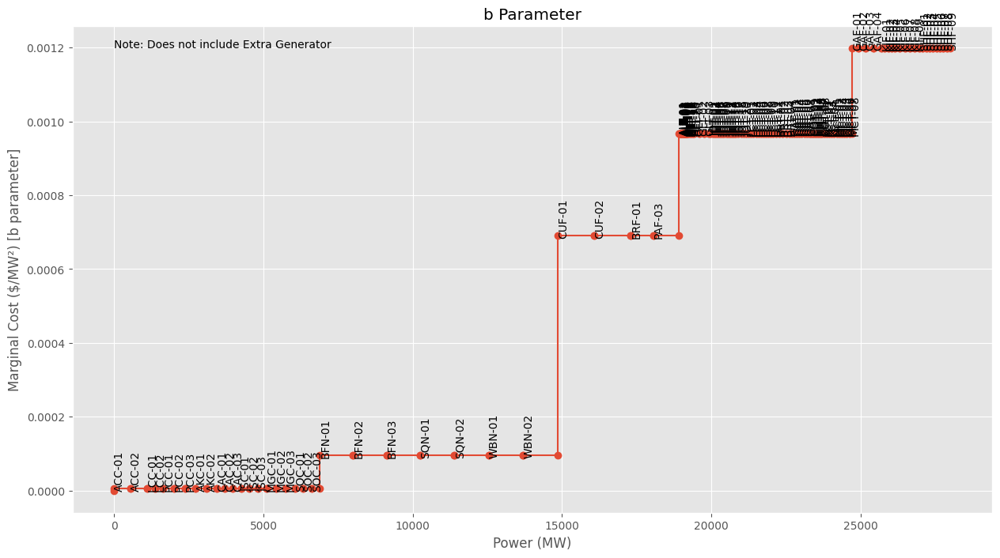

In [35]:
plt.figure(figsize=(15,8), dpi=100)
ax = plt.gca()
x = [0, ]
y = [0, ]
for g in sorted(
    simulations[0].generators,
    key=lambda x: x.b[0]
):
    if "Extra" not in g.name:
        ax.annotate(
            text=g.name,
            xy=(x[-1], g.b[0]),
            rotation=90,
        )
        x.append(x[-1])
        y.append(g.b[0])
        x.append(x[-1] + g.p_max[0])
        y.append(g.b[0])
plt.plot(x, y, 'o-')
plt.ylabel("Marginal Cost ($/MW²) [b parameter]")
plt.xlabel("Power (MW)")
plt.text(x=0, y=max(y), s="Note: Does not include Extra Generator")
plt.title("b Parameter")
plt.show()

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\3712696201.py:7: RuntimeWarning: divide by zero encountered in scalar divide
  key=lambda i: (i.a[0] + 2 * i.b[0] * i.p_max[0]) / i.p_max[0]


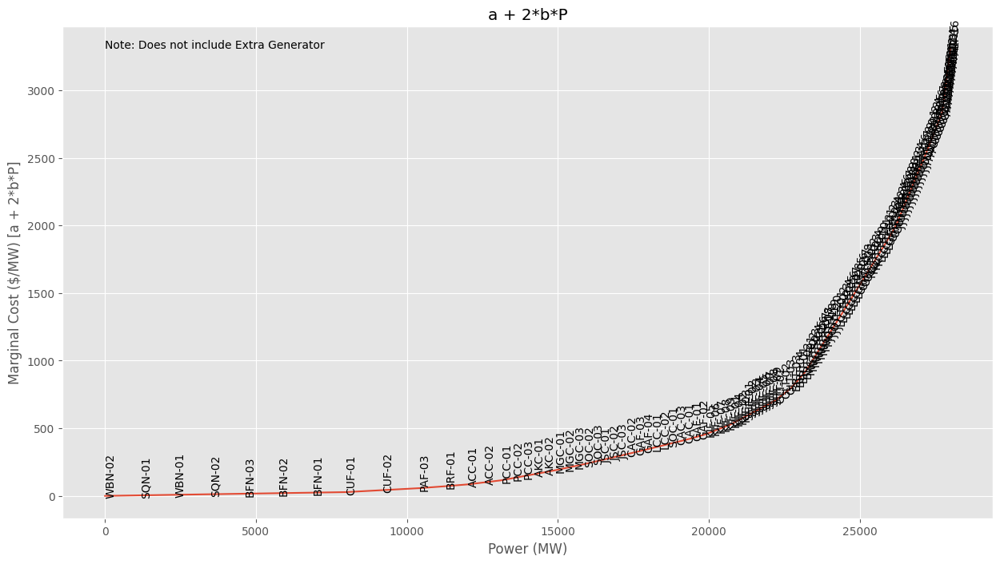

In [36]:
plt.figure(figsize=(15,8), dpi=100)
ax = plt.gca()
x = [0, ]
y = [0, ]
for g in sorted(
    simulations[0].generators,
    key=lambda i: (i.a[0] + 2 * i.b[0] * i.p_max[0]) / i.p_max[0]
):
    if "Extra" not in g.name:
        ax.annotate(
            text=g.name,
            xy=(x[-1], y[-1]),
            rotation=90,
        )
        new_x = x[-1] + g.p_max[0]
        new_y = y[-1] + g.a[0] + 2 * g.b[0] * g.p_max[0]
        x.append(new_x)
        y.append(new_y)
        
plt.plot(x, y, '-')
plt.ylabel("Marginal Cost ($/MW) [a + 2*b*P]")
plt.xlabel("Power (MW)")
plt.text(x=0, y=max(y), s="Note: Does not include Extra Generator")
plt.title("a + 2*b*P")
plt.show()

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\4196528144.py:7: RuntimeWarning: invalid value encountered in scalar divide
  key=lambda g: (g.a[0] * g.p_max[0] + g.b[0] * g.p_max[0] ** 2) / g.p_max[0]


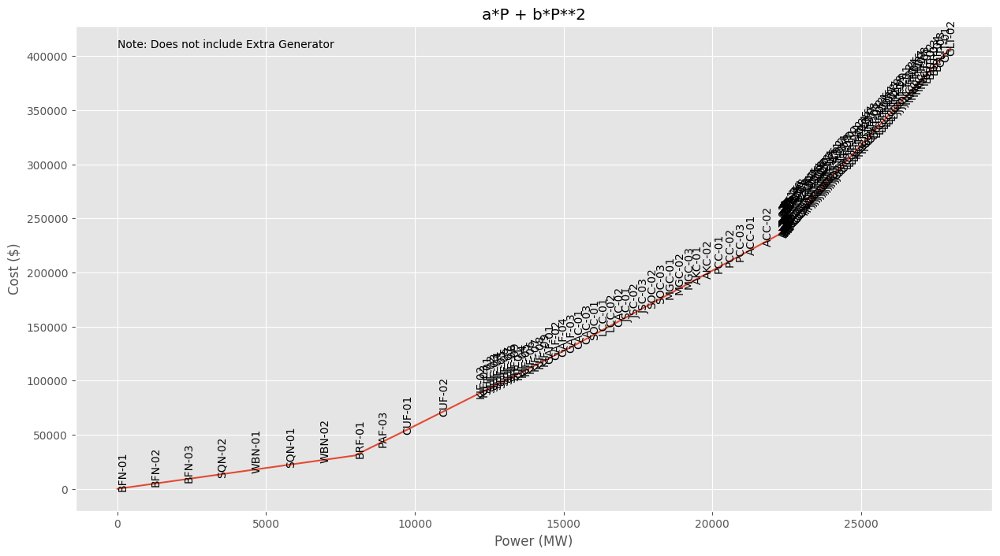

In [37]:
plt.figure(figsize=(15,8), dpi=100)
ax = plt.gca()
x = [0, ]
y = [0, ]
for g in sorted(
    simulations[0].generators,
    key=lambda g: (g.a[0] * g.p_max[0] + g.b[0] * g.p_max[0] ** 2) / g.p_max[0]
):
    if "Extra" not in g.name:
        ax.annotate(
            text=g.name,
            xy=(x[-1], y[-1]),
            rotation=90,
        )
        new_x = x[-1] + g.p_max[0]
        new_y = y[-1] + g.a[0] * g.p_max[0] + g.b[0] * g.p_max[0] ** 2
        x.append(new_x)
        y.append(new_y)
        
plt.plot(x, y, '-')
plt.ylabel("Cost ($)")
plt.xlabel("Power (MW)")
plt.text(x=0, y=max(y), s="Note: Does not include Extra Generator")
plt.title("a*P + b*P**2")
plt.show()

C:\Users\vtt513\AppData\Local\Temp\ipykernel_26292\1246705401.py:7: RuntimeWarning: invalid value encountered in scalar divide
  key=lambda g: (g.a[0] * g.p_max[0] + g.b[0] * g.p_max[0] ** 2) / g.p_max[0]


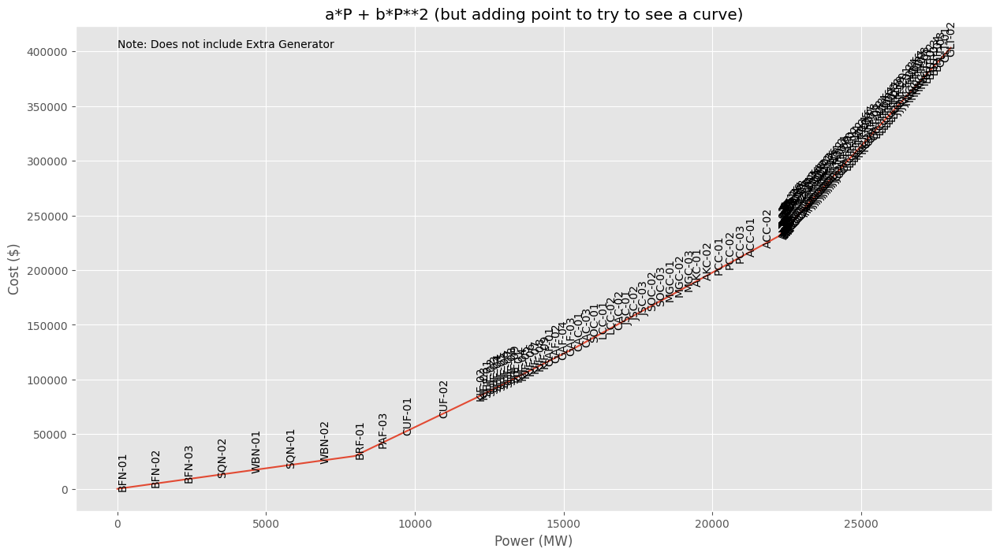

In [38]:
plt.figure(figsize=(15,8), dpi=100)
ax = plt.gca()
x = [0, ]
y = [0, ]
for g in sorted(
    simulations[0].generators,
    key=lambda g: (g.a[0] * g.p_max[0] + g.b[0] * g.p_max[0] ** 2) / g.p_max[0]
):
    if "Extra" not in g.name:
        ax.annotate(
            text=g.name,
            xy=(x[-1], y[-1]),
            rotation=90,
        )
        interval = g.p_max[0] / 10
        for _ in range(10):
            new_x = x[-1] + interval
            new_y = y[-1] + g.a[0] * interval + g.b[0] * interval ** 2
            x.append(new_x)
            y.append(new_y)
        
plt.plot(x, y, '-')
plt.ylabel("Cost ($)")
plt.xlabel("Power (MW)")
plt.text(x=0, y=max(y), s="Note: Does not include Extra Generator")
plt.title("a*P + b*P**2 (but adding point to try to see a curve)")
plt.show()